In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import json

import matplotlib as mpl
mpl.style.use("default")
from datetime import datetime
import statsmodels.api as sm
from pykalman import KalmanFilter
from math import sqrt

from joblib import Parallel, delayed

import datetime
import sys
sys.path.insert(0, '/home/ubuntu/kolomeytsev/centurion/')
sys.path.insert(0, '/home/ubuntu/kolomeytsev/analytics/')
from common.exchanges.exchange_main import ExchangeDB
from common.etl.models import OHLCVCandle, Exchange, Instrument
from common.etl.helpers import ExtractorCandles, ExtractorOrderbooks, ExtractorTrades, Resolution

from utils.constants import *
from utils.utils_analytics import download_data_from_db


def transform_to_timestamp(datetime_time):
    return int(datetime.datetime.strptime(datetime_time, "%Y-%m-%d %H:%M:%S").timestamp())


def convert_to_panel(df, companies, features, start_ts=None, end_ts=None):
    all_dates = sorted(set(df["minor"]))
    all_dates = np.array(all_dates)
    if start_ts is not None:
        start = datetime.datetime.fromtimestamp(start_ts).strftime("%Y-%m-%d %H-%M-%S")
        all_dates = all_dates[all_dates > start]
    if end_ts is not None:
        end = datetime.datetime.fromtimestamp(end_ts).strftime("%Y-%m-%d %H-%M-%S")
        all_dates = all_dates[all_dates < end]
    dates = list(all_dates)
    time_index = pd.to_datetime(dates)
    panel = pd.Panel(items=features, major_axis=companies, minor_axis=time_index, dtype=np.float32)
    for company in companies:
        df_company = df[df["major"] == company]
        df_company = df_company.set_index(pd.to_datetime(df_company["minor"]))
        for feat in features:
            panel.loc[feat, company, time_index] = df_company.loc[time_index][feat]
    return panel


def convert_to_panel_combined(df, companies, start_ts=None, end_ts=None):
    df.index = pd.to_datetime(df["Unnamed: 0"])
    all_dates = sorted(set(df["Unnamed: 0"]))
    all_dates = np.array(all_dates)
    if start_ts is not None:
        start = datetime.datetime.fromtimestamp(start_ts).strftime("%Y-%m-%d %H-%M-%S")
        all_dates = all_dates[all_dates > start]
    if end_ts is not None:
        end = datetime.datetime.fromtimestamp(end_ts).strftime("%Y-%m-%d %H-%M-%S")
        all_dates = all_dates[all_dates < end]
    time_index = pd.to_datetime(all_dates)

    panel = pd.Panel(items=["close"], major_axis=companies, minor_axis=time_index, dtype=np.float32)
    for company in companies:
        panel.loc["close", company, time_index] = df.loc[time_index, company]
    return panel


def compute_ubah(df):
    values = df.values
    companies_returns = values[:] / values[0]
    ubah = companies_returns.mean(1)
    return ubah


def compute_crp(df):
    values = df.values
    companies_returns = values[1:] / values[:-1]
    crp = np.cumprod(companies_returns.mean(1))
    return crp

/usr/local/lib/python3.6/dist-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
/usr/local/lib/python3.6/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [3]:
companies = [
    "FEES", "PLZL", "LKOH", "ROSN", "GMKN", "POLY", 
    "MAGN", "RSTI", "MGNT", "ALRS", "MSNG", "NVTK", 
    "MVID", "HYDR", "RTKM", "VTBR", "PHOR", 
    "CHMF", "AFLT", "SNGS", "MTSS", "RASP", 
    "MFON", "NLMK", "TATN", "SBER", "GAZP", 
    "SIBN", "MOEX", "IRAO",
    "markowitz30_117", "markowitz40_117", "min_variance30_119", "min_variance40_119", "sspo_7_109", 
    "trend_follow_6_113", "rmr_trend_follow_3_91", "bmar1_3_top2_79", "bmar1_3_top5_79", "bollinger_10_110", 
    "bollinger_20_110", "bollinger_30_110", "rmr_trend_follow_95", "rmr_trend_follow_2_95", "anticor_3_84", 
    "anticor_7_84", "arma_3_104", "markowitz_114", "eg_top3_shorts_0_1_96", "eg_top3_shorts_1_96", "arma_3_105", 
    "cfr_ogd3_107", "cfr_ogd3_3_3_107", "cfr_ons3_3_3_107", "bmar1_3_85", "bmar1_5_85", "bmar2_85", 
    "rmr_trend_follow_73", "ons_100", "arma_108"
]
features = ["close"]
start_time = "2014-02-01 10:00:00"
end_time = "2019-05-03 10:00:00"
start_ts = transform_to_timestamp(start_time)
end_ts = transform_to_timestamp(end_time)

In [5]:
d = pd.read_csv("/home/ubuntu/kolomeytsev/rl_server_moex/moex/data/combined_hour_8.csv")
panel = convert_to_panel_combined(d, companies, start_ts, end_ts)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  


In [6]:
panel.close

,2014-02-14 10:00:00,2014-02-14 18:00:00,2014-02-17 10:00:00,2014-02-17 18:00:00,2014-02-18 10:00:00,2014-02-18 18:00:00,2014-02-19 10:00:00,2014-02-19 18:00:00,2014-02-20 10:00:00,2014-02-20 18:00:00,...,2019-04-25 10:00:00,2019-04-25 18:00:00,2019-04-26 10:00:00,2019-04-26 18:00:00,2019-04-29 10:00:00,2019-04-29 18:00:00,2019-04-30 10:00:00,2019-04-30 18:00:00,2019-05-02 10:00:00,2019-05-02 18:00:00
FEES,0.083410,0.082830,0.082500,0.081700,0.082100,0.080450,0.080650,0.078620,0.078160,0.077650,...,0.165400,0.165160,0.165860,0.165660,0.165420,0.164360,0.164960,0.166880,0.166420,0.164780
PLZL,735.400024,746.000000,744.900024,765.000000,773.000000,781.299988,780.000000,760.700012,750.400024,755.000000,...,4953.000000,4955.000000,4978.000000,5037.500000,5074.000000,5054.000000,5052.500000,5045.000000,5015.000000,5029.000000
LKOH,2033.500000,2036.599976,2047.099976,2043.900024,2049.899902,2040.000000,2039.300049,2025.099976,2010.099976,2042.900024,...,5780.500000,5664.500000,5630.000000,5597.500000,5607.500000,5557.000000,5566.500000,5494.000000,5524.000000,5534.000000
ROSN,245.500000,247.179993,248.320007,249.940002,249.860001,250.020004,250.130005,247.699997,245.320007,246.539993,...,440.049988,433.399994,435.200012,433.399994,435.750000,432.049988,433.750000,428.700012,427.500000,422.600006
GMKN,5626.000000,5673.000000,5717.000000,5757.000000,5789.000000,5814.000000,5812.000000,5824.000000,5781.000000,5850.000000,...,14284.000000,14372.000000,14450.000000,14598.000000,14756.000000,14458.000000,14480.000000,14342.000000,14280.000000,14222.000000
POLY,368.059998,383.750000,385.989990,398.420013,397.000000,388.000000,392.000000,393.170013,390.109985,381.209991,...,663.299988,667.299988,663.599976,670.200012,674.000000,668.500000,671.099976,676.400024,674.500000,669.900024
MAGN,6.849000,6.873000,6.891000,6.907000,6.934000,7.046000,6.960000,6.826000,6.762000,6.739000,...,44.060001,44.000000,43.985001,44.404999,44.360001,44.169998,44.150002,44.134998,44.250000,44.985001
RSTI,0.724000,0.727000,0.728000,0.730000,0.737000,0.732000,0.732000,0.726000,0.725000,0.722000,...,1.097000,1.085000,1.080300,1.079000,1.079000,1.084800,1.087800,1.074400,1.072800,1.078800
MGNT,8469.900391,8500.000000,8569.900391,8589.500000,8632.200195,8605.000000,8577.200195,8661.700195,8570.000000,8695.099609,...,3647.500000,3660.500000,3655.000000,3584.500000,3545.500000,3603.000000,3637.000000,3698.500000,3687.500000,3762.000000
ALRS,35.669998,36.167000,36.001999,35.849998,36.000000,36.040001,36.160000,36.500000,36.056999,36.549999,...,95.400002,94.870003,95.139999,94.070000,94.320000,94.309998,94.389999,94.919998,94.309998,95.019997


In [9]:
sys.path.insert(0, '/home/ubuntu/kolomeytsev/rl_server_moex/')

from rllib.tools.configprocess import preprocess_config
from rllib.tools.configprocess import load_config
from rllib.tools.trade import save_test_data
from rllib.tools.shortcut import execute_backtest
from rllib.resultprocess import plot

from rllib.tools.configprocess import parse_time, check_input_same

from rllib.tdagent.algorithms import crp, ons, olmar, up, trend_follow, hmm_trend_follow
from rllib.trade.backtest import BackTest
import tensorflow as tf

W0522 16:37:33.564343 139790011119424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/tflearn/helpers/summarizer.py:9: The name tf.summary.merge is deprecated. Please use tf.compat.v1.summary.merge instead.

W0522 16:37:33.565565 139790011119424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/tflearn/helpers/trainer.py:25: The name tf.summary.FileWriter is deprecated. Please use tf.compat.v1.summary.FileWriter instead.

W0522 16:37:33.577207 139790011119424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/tflearn/collections.py:13: The name tf.GraphKeys is deprecated. Please use tf.compat.v1.GraphKeys instead.

W0522 16:37:33.583112 139790011119424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/tflearn/config.py:123: The name tf.get_collection is deprecated. Please use tf.compat.v1.get_collection instead.

W0522 16:37:33.589203 139790011119424 deprecation_wrapper.py:119] From /usr/local/lib/

In [10]:
%load_ext autoreload
%autoreload 2

In [11]:
panel.minor_axis[0], panel.minor_axis[-1]

(Timestamp('2014-02-14 10:00:00'), Timestamp('2019-05-02 18:00:00'))

In [12]:
import matplotlib.ticker as plticker

In [151]:
def sharpe_ratio(returns, n_trades_per_year=252):
    return np.mean(returns) / np.std(returns) * np.sqrt(n_trades_per_year)


def plot_rl_results(results, accumulate_method="cumsum", title="", plot_with_fee=True, plot_no_fee=True,
                    ubah=None, dates=None, trades_per_day=1, show_flag=True, lw=2, semilog_flag=False,
                   returns_percents_flag=False, strat_label="", figsize=(18,12), figure_flag=True):
    if accumulate_method == "cumsum":
        apv_no_fee = np.cumsum(results[1] - 1) + 1
        apv_with_fee = np.cumsum(results[0] - 1) + 1
    else:
        apv_no_fee = np.cumprod(results[1])
        apv_with_fee = np.cumprod(results[0])
    if returns_percents_flag:
        print("apv_no_fee:", apv_no_fee[-1] - 1)
        print("apv_with_fee:", apv_with_fee[-1] - 1)
    else:
        print("apv_no_fee:", apv_no_fee[-1])
        print("apv_with_fee:", apv_with_fee[-1])
    print()
    print("sharpe_no_fee:", sharpe_ratio(results[1] - 1, 252 * trades_per_day))
    print("sharpe_with_fee:", sharpe_ratio(results[0] - 1, 252 * trades_per_day))
    print()
    if figure_flag:
        fig, ax = plt.subplots(figsize=figsize)
    #plt.figure()
    indices = list(range(len(apv_with_fee)))
    if semilog_flag:
        func = plt.semilogy
    else:
        func = plt.plot
    if returns_percents_flag:
        if plot_with_fee:
            func(indices, apv_with_fee - 1, label=strat_label + "with fee", lw=lw, c="C2")
        if plot_no_fee:
            func(indices, apv_no_fee - 1, label=strat_label + "no fee", lw=lw)
    else:
        if plot_with_fee:
            func(indices, apv_with_fee, label=strat_label + "with fee", lw=lw)
        if plot_no_fee:
            func(indices, apv_no_fee, label=strat_label + "no fee", lw=lw)
    if ubah is not None:
        if returns_percents_flag:
            plt.plot(indices[:-1] - 1, ubah, label="ubah")
        else:
            plt.plot(indices[:-1], ubah, label="ubah")
    plt.legend(prop={"size": 15})
    plt.title(title, size=18)
    plt.xlabel("Time", size=16)
    if returns_percents_flag:
        plt.ylabel("Retruns (%)", size=16)
    else:
        plt.ylabel("Retruns", size=16)
    plt.grid(color='lightgray', linestyle='dashed')

    dates_str = [str(x)[:10] for x in dates]
    step = int(len(dates_str) / 10)
    plt.xticks(indices[::step], dates_str[::step], rotation=30)

    #loc = plticker.MultipleLocator(base=int(len(dates_str) / 10))
    #ax.xaxis.set_major_locator(loc)
    
    #xtick_locator = mpl.dates.AutoDateLocator()
    #xtick_formatter = mpl.dates.AutoDateFormatter(xtick_locator)
    #ax.xaxis.set_major_locator(xtick_locator)
    #ax.xaxis.set_major_formatter(xtick_formatter)
    if show_flag:
        plt.show()

    
def process_results(path_adding, test_portion, title, start='2016/01/01', end='2019/05/05',
                    path_start="/home/ubuntu/kolomeytsev/rl_server_moex",
                   accumulate_method="cumsum", plot_flag=True, fee=0.0004, trades_per_day=1):
    tf.reset_default_graph()
    path = path_start + path_adding
    config = load_config(path + "net_config.json")

    config["input"]["start_date"] = start
    config["input"]["end_date"] = end
    config["input"]["test_portion"] = test_portion
    config["trading"]["trading_consumption"] = fee

    backtester = BackTest(config, net_dir=path + "netfile", agent=None, 
                          agent_type="nn")
    
    companies_prices = backtester._rolling_trainer.test_set["X"][:,0,:,-1]
    companies_returns = companies_prices[1:] / companies_prices[:-1]
    ubah = np.cumsum(companies_returns.mean(1) - 1) + 1
    print("days number:", ubah.shape[0] / trades_per_day)

    backtester.start_trading()
    results = (backtester.test_pc_vector, backtester.test_pc_vector_no_commission)

    if plot_flag:
        plot_rl_results(results, accumulate_method=accumulate_method, 
                    title=title, ubah=ubah, dates=backtester.test_dates,
                       trades_per_day=trades_per_day)
    return backtester, results

In [152]:
def plot_multiple_results(multiple_results, agent_names, plot_no_fee=True, plot_with_fee=True, semilog_flag=False,
                          accumulate_method="cumsum", title="", ubah=None, dates=None, trades_per_day=1):
    fig, ax = plt.subplots(figsize=(16, 10))
    for results, agent_name in zip(multiple_results, agent_names):
        print(agent_name)
        if accumulate_method == "cumsum":
            apv_no_fee = np.cumsum(results[1] - 1) + 1
            apv_with_fee = np.cumsum(results[0] - 1) + 1
        else:
            apv_no_fee = np.cumprod(results[1])
            apv_with_fee = np.cumprod(results[0])
        print("apv_no_fee:", apv_no_fee[-1])
        print("apv_with_fee:", apv_with_fee[-1])
        print()
        print("sharpe_no_fee:", sharpe_ratio(results[1] - 1, 252 * trades_per_day))
        print("sharpe_with_fee:", sharpe_ratio(results[0] - 1, 252 * trades_per_day))
        print()
        
        indices = list(range(len(apv_with_fee)))
        if plot_with_fee:
            if semilog_flag:
                plt.semilogy(indices, apv_with_fee, label="%s, with fee" % agent_name)
            else:
                plt.plot(indices, apv_with_fee, label="%s, with fee" % agent_name)

        if plot_no_fee:
            if semilog_flag:
                plt.semilogy(indices, apv_no_fee, label="%s, no fee" % agent_name)
            else:
                plt.plot(indices, apv_no_fee, label="%s, no fee" % agent_name)
    
    plt.legend(prop={"size": 15})
    plt.title(title, size=18)
    plt.xlabel("Time", size=14)
    plt.ylabel("Returns", size=14)
    plt.grid(color='lightgray', linestyle='dashed')
    dates_str = [str(x)[:10] for x in dates]
    step = int(len(dates_str) / 10)
    if ubah is not None:
        plt.plot(indices[:-1], ubah, label="ubah")
    plt.xticks(indices[::step], dates_str[::step], rotation=45)
    plt.show()

In [15]:
from rllib.tdagent.algorithms import crp, ons, olmar, rmr

In [16]:
def run_backtest_traditional(agent_name, params=None):
    if agent_name == "rmr":
        if params is not None:
            agent = rmr.RMR(**params)
        else:
            agent = rmr.RMR()
    elif agent_name == "olmar":
        if params is not None:
            agent = olmar.OLMAR(**params)
        else:
            agent = olmar.OLMAR()
    elif agent_name == "crp":
        agent = crp.CRP()
    elif agent_name == "ons":
        if params is not None:
            agent = ons.ONS(**params)
        else:
            agent = ons.ONS()
    else:
        print("Wrong agent name")
        return
    backtester = BackTest(config, agent=agent, agent_type="traditional")
    backtester.start_trading()
    results = (backtester.test_pc_vector, backtester.test_pc_vector_no_commission)
    return results

In [17]:
all_assets = [
    "FEES", "PLZL", "LKOH", "ROSN", "GMKN", "POLY", 
    "MAGN", "RSTI", "MGNT", "ALRS", "MSNG", "NVTK", 
    "MVID", "HYDR", "RTKM", "VTBR", "PHOR", 
    "CHMF", "AFLT", "SNGS", "MTSS", "RASP", 
    "MFON", "NLMK", "TATN", "SBER", "GAZP", 
    "SIBN", "MOEX", "IRAO",
    "markowitz30_117", "markowitz40_117", "min_variance30_119", "min_variance40_119", "sspo_7_109", 
    "trend_follow_6_113", "rmr_trend_follow_3_91", "bmar1_3_top2_79", "bmar1_3_top5_79", "bollinger_10_110", 
    "bollinger_20_110", "bollinger_30_110", "rmr_trend_follow_95", "rmr_trend_follow_2_95", "anticor_3_84", 
    "anticor_7_84", "arma_3_104", "markowitz_114", "eg_top3_shorts_0_1_96", "eg_top3_shorts_1_96", "arma_3_105", 
    "cfr_ogd3_107", "cfr_ogd3_3_3_107", "cfr_ons3_3_3_107", "bmar1_3_85", "bmar1_5_85", "bmar2_85", 
    "rmr_trend_follow_73", "ons_100", "arma_108"
]
companies = [
    "FEES", "PLZL", "LKOH", "ROSN", "GMKN", "POLY", 
    "MAGN", "RSTI", "MGNT", "ALRS", "MSNG", "NVTK", 
    "MVID", "HYDR", "RTKM", "VTBR", "PHOR", 
    "CHMF", "AFLT", "SNGS", "MTSS", "RASP", 
    "MFON", "NLMK", "TATN", "SBER", "GAZP", 
    "SIBN", "MOEX", "IRAO"
]
strategies = [
    "markowitz30_117", "markowitz40_117", "min_variance30_119", "min_variance40_119", "sspo_7_109", 
    "trend_follow_6_113", "rmr_trend_follow_3_91", "bmar1_3_top2_79", "bmar1_3_top5_79", "bollinger_10_110", 
    "bollinger_20_110", "bollinger_30_110", "rmr_trend_follow_95", "rmr_trend_follow_2_95", "anticor_3_84", 
    "anticor_7_84", "arma_3_104", "markowitz_114", "eg_top3_shorts_0_1_96", "eg_top3_shorts_1_96", "arma_3_105", 
    "cfr_ogd3_107", "cfr_ogd3_3_3_107", "cfr_ons3_3_3_107", "bmar1_3_85", "bmar1_5_85", "bmar2_85", 
    "rmr_trend_follow_73", "ons_100", "arma_108"
]

In [21]:
agents = ["rmr", "olmar", "crp", "ons"]

path = "/home/ubuntu/kolomeytsev/rl_server_moex/moex/moex_train_package_old/moex_train_package_2016_2019_hour_1_moex_23_instr/1/"
config = load_config(path + "net_config.json")

config["input"]["start_date"] = '2016/01/01'
config["input"]["end_date"] = '2019/05/06'
config["input"]["test_portion"] = 0.15
config["trading"]["trading_consumption"] = 0.0004

multiple_results = []
for agent in agents:
    res = run_backtest_traditional(agent)
    multiple_results.append(res)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557100800 3600 ['close']


FileNotFoundError: [Errno 2] File b'/home/ds/kolomeytsev/rl_server_moex/data/moex_old_2014_2019.csv' does not exist: b'/home/ds/kolomeytsev/rl_server_moex/data/moex_old_2014_2019.csv'

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 14400 ['close', 'high', 'low']
periods:  14400 14400
global_data shape:  (3, 23, 2526)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75e86e8c18>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_4/moex_train_package_2016_2019_hour_4_moex_23_instr_100k_test_0_07_win_30_feat_3/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_4/moex_train_package_2016_2019_hour_4_moex_23_instr_100k_test_0_07_win_30_feat_3/1/netfile


days number: 1184.0
apv_no_fee: 3.433051
apv_with_fee: 2.8688793

sharpe_no_fee: 2.0952222666935336
sharpe_with_fee: 1.6094475611725187



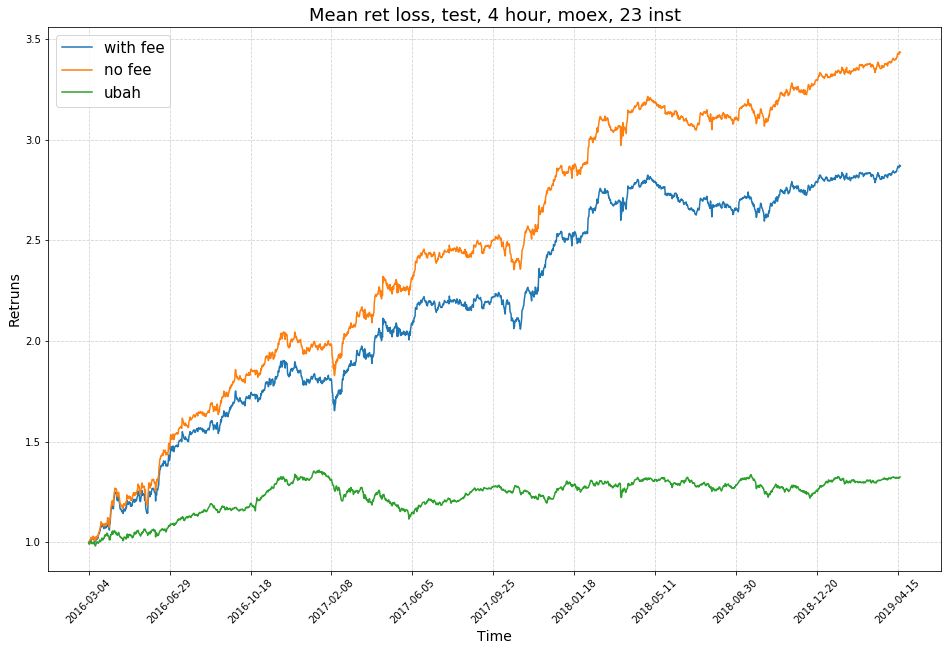

In [119]:
path = "/moex_train_package_hour_4/moex_train_package_\
2016_2019_hour_4_moex_23_instr_100k_test_0_07_win_30_feat_3/1/"
backtester, res_rl = process_results(path, 0.95, "Mean ret loss, test, 4 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 3600 ['close', 'high', 'low']
periods:  3600 3600
global_data shape:  (3, 23, 7578)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f7713024550>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_1/moex_train_package_2016_2019_hour_1_moex_23_instr_100k_test_0_07_win_30_feat_3/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_1/moex_train_package_2016_2019_hour_1_moex_23_instr_100k_test_0_07_win_30_feat_3/1/netfile


days number: 896.0
apv_no_fee: 6.3957458
apv_with_fee: 4.3646917

sharpe_no_fee: 4.256939778076398
sharpe_with_fee: 2.6541020326334293



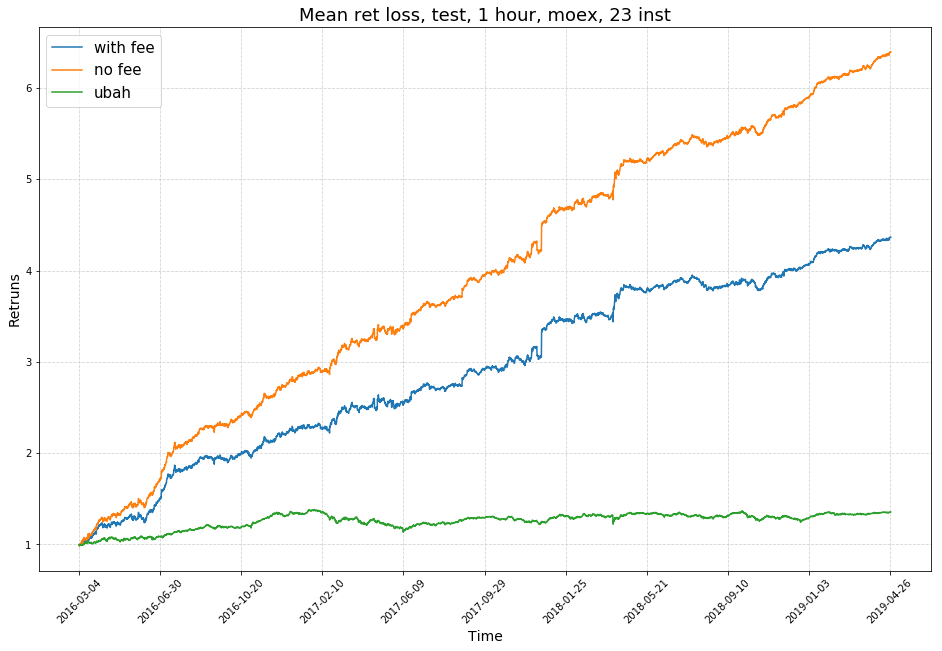

In [133]:
path = "/moex_train_package_hour_1/moex_train_package_\
2016_2019_hour_1_moex_23_instr_100k_test_0_07_win_30_feat_3/1/"
backtester, res_rl = process_results(path, 0.95, "Mean ret loss, test, 1 hour, moex, 23 inst", 
                                     fee=3e-4, trades_per_day=8)

In [135]:
companies_prices = backtester._rolling_trainer.test_set["X"][:,0,:,-1]

In [54]:
path = "combined_new/networks/win_15_cnn_2/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 8 hour, moex, Combination, Test", 
                                     fee=3e-4, trades_per_day=2,
                                    path_start = "/home/ubuntu/kolomeytsev/rl_server_moex/moex", 
                                     start='2014/02/14', end='2019/05/03', accumulate_method="cumprod")

FileNotFoundError: [Errno 2] No such file or directory: '/home/ubuntu/kolomeytsev/rl_server_moex/moexcombined_new/networks/win_15_cnn_2net_config.json'

['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1556841600 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2628)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f2198139550>


/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


days number: 125.5
apv_no_fee: 1.808785
apv_with_fee: 1.5565984

sharpe_no_fee: 5.463158137494601
sharpe_with_fee: 4.108594350722368



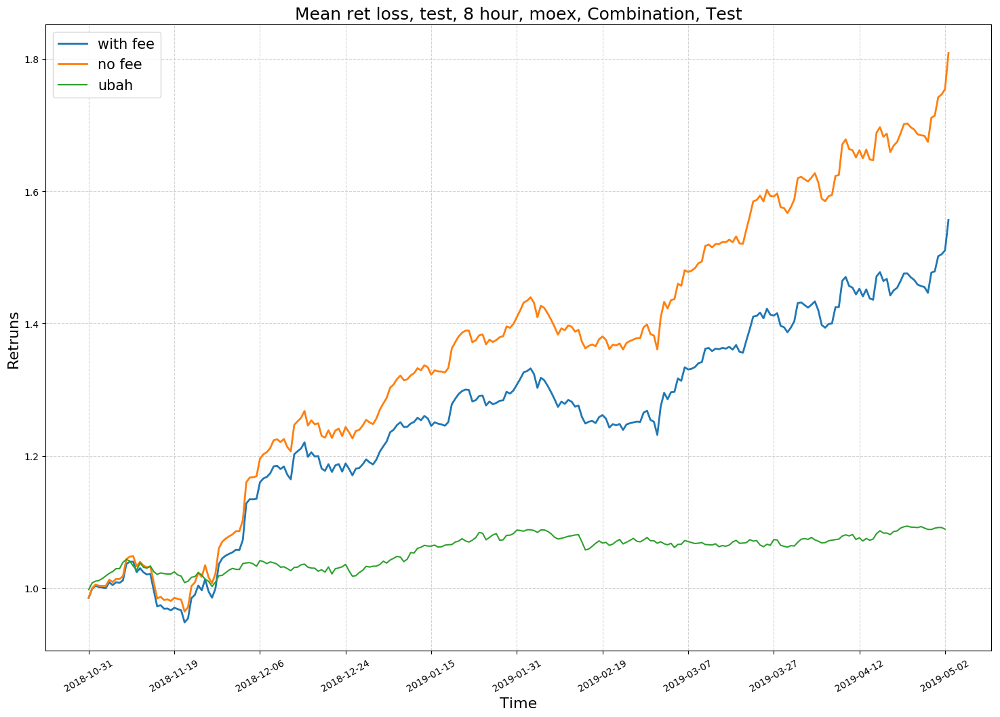

In [47]:
path = "/combined/hour_8/win_10/1/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 8 hour, moex, Combination, Test", 
                                     fee=3e-4, trades_per_day=2,
                                    path_start = "/home/ubuntu/kolomeytsev/rl_server_moex/moex", 
                                     start='2014/02/14', end='2019/05/03', accumulate_method="cumprod")

In [141]:
pathes_dict = {
    "CNN": "/combined_new/networks/win_10_cnn_3/1/",
    "RNN": "/combined_new/rnn/win_7_rnn_60_lr_1/1/",
    "LSTM": "/combined_new/lstm/win_7_lstm_20_lr_1/1/",
    "GRU": "/combined_new/gru/win_6_rnn_64_dense_64_lr_1/1/"
}

In [142]:
results_multi = {}
results_multi_train = {}
for name, path in pathes_dict.items():
    backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 8 hour, moex, Combination, Test", 
                                     fee=3e-4, trades_per_day=2, plot_flag=False,
                                    path_start = "/home/ubuntu/kolomeytsev/rl_server_moex/moex", 
                                     start='2014/02/14', end='2019/05/03', accumulate_method="cumprod")
    results_multi[name] = (res_rl, backtester.test_dates)
    backtester, res_rl = process_results(path, 0.98, "Mean ret loss, test, 8 hour, moex, Combination, Train", 
                                     fee=3e-4, trades_per_day=2, plot_flag=False,
                                    path_start = "/home/ubuntu/kolomeytsev/rl_server_moex/moex", 
                                     start='2014/02/14', end='2018/10/31', accumulate_method="cumprod")
    results_multi_train[name] = (res_rl, backtester.test_dates)

['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1556841600 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2628)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f202a750898>


/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


days number: 125.5
['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1540944000 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2376)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f2023

/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


days number: 1158.5
['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1556841600 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2628)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f203

/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


days number: 127.0
['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1540944000 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2376)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f2033

/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


days number: 1160.0
['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1556841600 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2628)


/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f2033b09048>
days number: 127.0
['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1540944000 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60

/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


days number: 1160.0
['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1556841600 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2628)


/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f2033b03b70>
days number: 127.5
['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1540944000 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60

/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


days number: 1160.5


In [136]:
ls /home/ubuntu/kolomeytsev/rl_server_moex/moex/combined_new/gru/win_6_rnn_64_dense_64_lr_1/1/

checkpoint       netfile.data-00000-of-00001  netfile.meta
net_config.json  netfile.index                tensorboard/


['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1556841600 28800 ['close']


/home/ubuntu/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:157: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


periods:  28800 28800
global_data shape:  (1, 60, 2628)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f21d814bb38>
days number: 125.5
apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



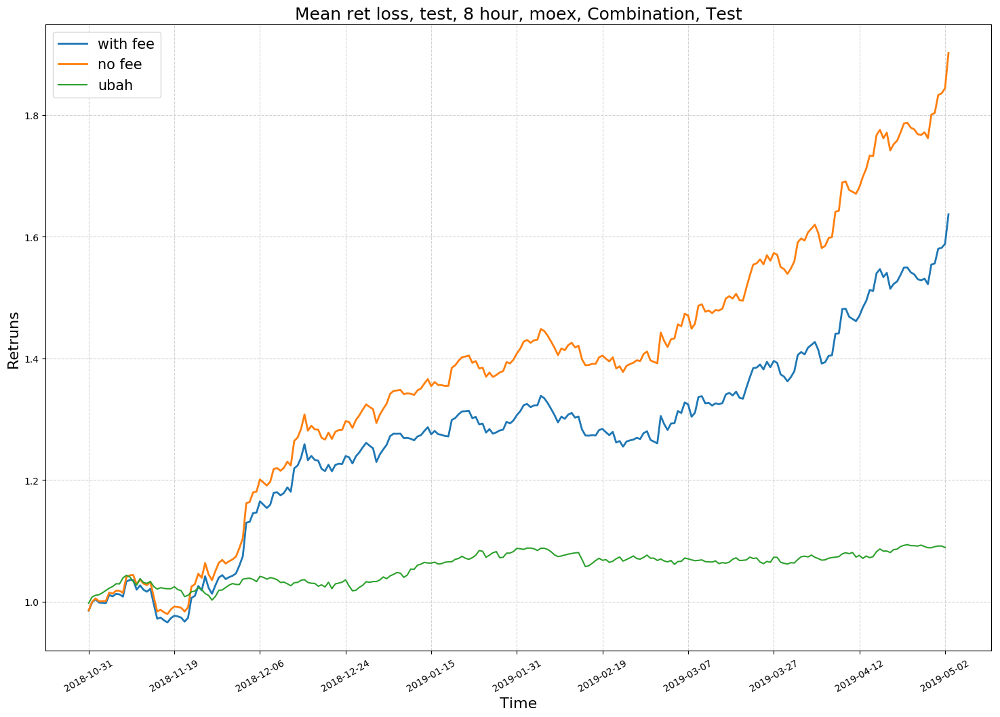

In [58]:
path = "/combined_new/networks/win_10_cnn_3/1/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 8 hour, moex, Combination, Test", 
                                     fee=3e-4, trades_per_day=2,
                                    path_start = "/home/ubuntu/kolomeytsev/rl_server_moex/moex", 
                                     start='2014/02/14', end='2019/05/03', accumulate_method="cumprod")

### With different UBAHs

In [193]:
strategy_prices = df_for_ubah[strategies].values

strategy_returns_ubah = strategy_prices / strategy_prices[0]

## Multi

## Test

In [170]:
for x, y in results_multi.items():
    print(x, y[1][0])

CNN 2018-10-31 10:00:00
RNN 2018-10-29 18:00:00
LSTM 2018-10-29 18:00:00
GRU 2018-10-29 10:00:00


In [175]:
results_multi_shifted = {}
results_multi_shifted["CNN"] = ((results_multi["CNN"][0][0], results_multi["CNN"][0][1]), results_multi["CNN"][1])
results_multi_shifted["RNN"] = ((results_multi["RNN"][0][0][3:], results_multi["RNN"][0][1][3:]), results_multi["RNN"][1][3:])
results_multi_shifted["LSTM"] = ((results_multi["LSTM"][0][0][3:], results_multi["LSTM"][0][1][3:]), results_multi["LSTM"][1][3:])
results_multi_shifted["GRU"] = ((results_multi["GRU"][0][0][4:], results_multi["GRU"][0][1][4:]), results_multi["GRU"][1][4:])

In [179]:
results_multi_shifted_train = {}
results_multi_shifted_train["CNN"] = ((results_multi_train["CNN"][0][0], 
                                 results_multi_train["CNN"][0][1]), results_multi_train["CNN"][1])
results_multi_shifted_train["RNN"] = ((results_multi_train["RNN"][0][0][3:], 
                                 results_multi_train["RNN"][0][1][3:]), results_multi_train["RNN"][1][3:])
results_multi_shifted_train["LSTM"] = ((results_multi_train["LSTM"][0][0][3:], 
                                  results_multi_train["LSTM"][0][1][3:]), results_multi_train["LSTM"][1][3:])
results_multi_shifted_train["GRU"] = ((results_multi_train["GRU"][0][0][4:], 
                                 results_multi_train["GRU"][0][1][4:]), results_multi_train["GRU"][1][4:])

In [176]:
for x, y in results_multi_shifted.items():
    print(x, y[1][0])

CNN 2018-10-31 10:00:00
RNN 2018-10-31 10:00:00
LSTM 2018-10-31 10:00:00
GRU 2018-10-31 10:00:00


apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703

apv_no_fee: 1.8533905
apv_with_fee: 1.5941619

sharpe_no_fee: 4.945422078398318
sharpe_with_fee: 3.7694542849125496

apv_no_fee: 1.7648358
apv_with_fee: 1.5189854

sharpe_no_fee: 4.933264914978646
sharpe_with_fee: 3.662598301404256

apv_no_fee: 1.8388568
apv_with_fee: 1.5817529

sharpe_no_fee: 5.565429049545587
sharpe_with_fee: 4.217689010590817



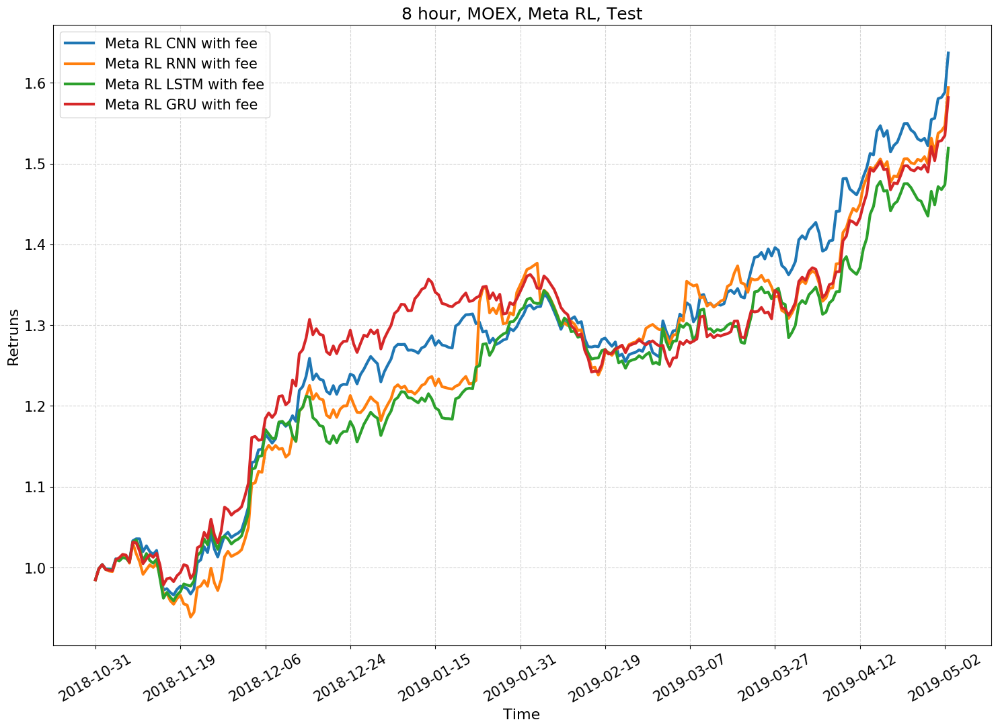

In [178]:
plot_figure = True
for name, res in results_multi_shifted.items():
    plot_rl_results(res[0], accumulate_method="cumprod", plot_no_fee=False,
                title="8 hour, MOEX, Meta RL, Test",
                dates=res[1], 
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL " + name + " ", figure_flag=plot_figure)
    plot_figure = False
    save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_multi_test"
    plt.savefig(save_path + ".eps", bbox_inches='tight')
    plt.close

In [145]:
save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_multi_test"
plt.savefig(save_path + ".eps", bbox_inches='tight')

<Figure size 640x480 with 0 Axes>

In [147]:
plt.close()

## Train

apv_no_fee: 1336.2124
apv_with_fee: 336.6017

sharpe_no_fee: 4.053889958840878
sharpe_with_fee: 3.3169295434478734

apv_no_fee: 1372.6318
apv_with_fee: 343.80975

sharpe_no_fee: 4.078947611871534
sharpe_with_fee: 3.336733399073231

apv_no_fee: 1470.8474
apv_with_fee: 369.58597

sharpe_no_fee: 4.047633574308953
sharpe_with_fee: 3.3209452444382075

apv_no_fee: 3519.494
apv_with_fee: 877.5261

sharpe_no_fee: 4.550883470460848
sharpe_with_fee: 3.812268133974942



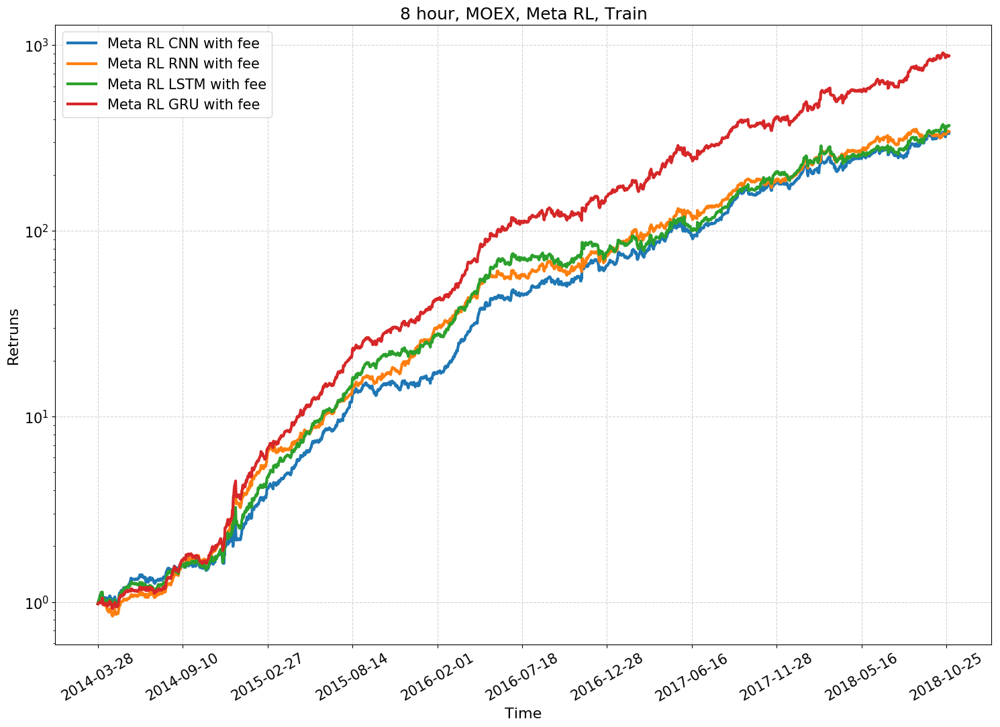

In [182]:
plot_figure = True
for name, res in results_multi_shifted_train.items():
    plot_rl_results(res[0], accumulate_method="cumprod", plot_no_fee=False,
                title="8 hour, MOEX, Meta RL, Train", semilog_flag=True,
                dates=res[1], 
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL " + name + " ", figure_flag=plot_figure)
    plot_figure = False
    save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_multi_train"
    plt.savefig(save_path + ".eps", bbox_inches='tight')

In [154]:
save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_multi_train"
plt.savefig(save_path + ".eps", bbox_inches='tight')
plt.close()

## Test with base

In [188]:
plot_figure = True
for name, res in results_multi_shifted.items():
    plot_rl_results(res[0], accumulate_method="cumprod", plot_no_fee=False,
                title="8 hour, MOEX, Meta RL, Test",
                dates=res[1], 
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL " + name + " ", figure_flag=plot_figure)
    plot_figure = False

for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i] , label="_".join(strat.split("_")[:-1]))

df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies mean", lw=4, linestyle="--")
plt.plot(compute_ubah(df_for_ubah[companies]), label="UBAH", lw=4, linestyle="--")
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., prop={"size": 14})
save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_multi_test_with_base"
plt.savefig(save_path + ".eps", bbox_inches='tight')
#plt.savefig(save_path + ".png", bbox_inches='tight')
plt.close()

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703

apv_no_fee: 1.8533905
apv_with_fee: 1.5941619

sharpe_no_fee: 4.945422078398318
sharpe_with_fee: 3.7694542849125496

apv_no_fee: 1.7648358
apv_with_fee: 1.5189854

sharpe_no_fee: 4.933264914978646
sharpe_with_fee: 3.662598301404256

apv_no_fee: 1.8388568
apv_with_fee: 1.5817529

sharpe_no_fee: 5.565429049545587
sharpe_with_fee: 4.217689010590817



In [184]:
save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_multi_test_with_base"
plt.savefig(save_path + ".eps", bbox_inches='tight')
#plt.savefig(save_path + ".png", bbox_inches='tight')
plt.close()

## Table test 

In [210]:
df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
strategy_prices = df_for_ubah[strategies].values

strategy_returns_ubah = strategy_prices / strategy_prices[0]

In [211]:
results_meta_test = {}
for x, res in results_multi_shifted.items():
    results_meta_test["meta_rl_" + x + "_1"] = {"returns_with_fee": res[0][0]}
for i, strat in enumerate(strategies):
    x = strategy_returns_ubah[:, i]
    results_meta_test[strat] = {}
    results_meta_test[strat]["returns_with_fee"] = x[1:] / x[:-1]

In [212]:
best_results, best_results_metrics = compute_returns(results_meta_test, 3e-4, flag=True, trades_per_day=2, is_cumulative=True)

In [214]:
best_results_metrics.items()

dict_items([('meta_rl_CNN_1', {'final_return': 1.6369913, 'apy': 1.6797403932915245, 'sharpe': 4.593552467929703, 'mdd': 0.083556294, 'volatility': 0.009800769}), ('meta_rl_RNN_1', {'final_return': 1.5941619, 'apy': 1.541352061689409, 'sharpe': 3.7694542849125496, 'mdd': 0.1384852, 'volatility': 0.011414527}), ('meta_rl_LSTM_1', {'final_return': 1.5189854, 'apy': 1.3073166170480732, 'sharpe': 3.662598301404256, 'mdd': 0.095879555, 'volatility': 0.010513248}), ('meta_rl_GRU_1', {'final_return': 1.5817529, 'apy': 1.5019422249815904, 'sharpe': 4.217689010590817, 'mdd': 0.12055993, 'volatility': 0.009955974}), ('markowitz30_117', {'final_return': 1.0082303, 'apy': 0.016661718113788027, 'sharpe': 0.19234271895357125, 'mdd': 0.071750104, 'volatility': 0.005774612}), ('markowitz40_117', {'final_return': 1.20744, 'apy': 0.4623151537496435, 'sharpe': 3.0196328544767757, 'mdd': 0.045052648, 'volatility': 0.005729834}), ('min_variance30_119', {'final_return': 1.0770059, 'apy': 0.16131924815774124

In [218]:
for i, (name, values) in enumerate(sorted(best_results_metrics.items(), reverse=True,
                                         key=lambda x: x[1]["sharpe"])):
    if name.split("_")[-1] == "top3":
        table_str = " %s Top-3 " % "_".join(name.split("_")[:-1])
    else:
        table_str = " %s " % " ".join(name.split("_")[:-1])
    for metric in metrics:
        if metric == "volatility":
            value_str = " %.4f" % values[metric]
        else:
            value_str = " %.2f" % values[metric]
        table_str += ("& " + value_str)
    if i % 2 == 1:
        pass
        print(table_str, "\\\\")
    else:
        print(table_str, "\\\\")

 meta rl CNN &  4.59&  1.64&  1.68&  0.08&  0.0098 \\
 meta rl GRU &  4.22&  1.58&  1.50&  0.12&  0.0100 \\
 meta rl RNN &  3.77&  1.59&  1.54&  0.14&  0.0114 \\
 meta rl LSTM &  3.66&  1.52&  1.31&  0.10&  0.0105 \\
 markowitz40 &  3.02&  1.21&  0.46&  0.05&  0.0057 \\
 eg top3 shorts 0 1 &  2.73&  1.21&  0.47&  0.06&  0.0065 \\
 eg top3 shorts 1 &  2.56&  1.19&  0.43&  0.06&  0.0064 \\
 bmar1 3 &  2.13&  1.25&  0.57&  0.10&  0.0100 \\
 bmar1 5 &  2.11&  1.25&  0.56&  0.11&  0.0099 \\
 bmar1 3 top2 &  2.11&  1.14&  0.31&  0.12&  0.0059 \\
 anticor 7 &  2.04&  1.16&  0.35&  0.09&  0.0067 \\
 min variance30 &  1.95&  1.08&  0.16&  0.03&  0.0035 \\
 anticor 3 &  1.92&  1.13&  0.27&  0.08&  0.0058 \\
 min variance40 &  1.74&  1.07&  0.15&  0.04&  0.0038 \\
 ons &  1.69&  1.07&  0.15&  0.04&  0.0039 \\
 bollinger 30 &  1.55&  1.12&  0.26&  0.08&  0.0069 \\
 rmr trend follow 3 &  1.36&  1.13&  0.27&  0.10&  0.0085 \\
 rmr trend follow &  1.25&  1.10&  0.22&  0.09&  0.0075 \\
 cfr ons3 3 3 &

## Train with base

In [195]:
plot_figure = True
for name, res in results_multi_shifted_train.items():
    plot_rl_results(res[0], accumulate_method="cumprod", plot_no_fee=False,
                title="8 hour, MOEX, Meta RL, Train",
                dates=res[1], semilog_flag=True,
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL " + name + " ", figure_flag=plot_figure)
    plot_figure = False

for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i] , label="_".join(strat.split("_")[:-1]))

df_for_ubah = panel["close"].T[(panel["close"].T.index > "2014-02-14 10:00:00") & \
                               (panel["close"].T.index < "2018-10-31 10:00:00")]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies mean", lw=4, linestyle="--")
plt.plot(compute_ubah(df_for_ubah[companies]), label="UBAH", lw=4, linestyle="--")
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., prop={"size": 14})
save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_multi_train_with_base"
plt.savefig(save_path + ".eps", bbox_inches='tight')
#plt.savefig(save_path + ".png", bbox_inches='tight')
plt.close()

apv_no_fee: 1336.2124
apv_with_fee: 336.6017

sharpe_no_fee: 4.053889958840878
sharpe_with_fee: 3.3169295434478734

apv_no_fee: 1372.6318
apv_with_fee: 343.80975

sharpe_no_fee: 4.078947611871534
sharpe_with_fee: 3.336733399073231

apv_no_fee: 1470.8474
apv_with_fee: 369.58597

sharpe_no_fee: 4.047633574308953
sharpe_with_fee: 3.3209452444382075

apv_no_fee: 3519.494
apv_with_fee: 877.5261

sharpe_no_fee: 4.550883470460848
sharpe_with_fee: 3.812268133974942



## Table train 

In [220]:
df_for_ubah = panel["close"].T[(panel["close"].T.index > "2014-02-14 10:00:00") & \
                               (panel["close"].T.index < "2018-10-31 10:00:00")]
strategy_prices = df_for_ubah[strategies].values

strategy_returns_ubah = strategy_prices / strategy_prices[0]

In [221]:
results_meta_train = {}
for x, res in results_multi_shifted_train.items():
    results_meta_train["meta_rl_" + x + "_1"] = {"returns_with_fee": res[0][0]}
for i, strat in enumerate(strategies):
    x = strategy_returns_ubah[:, i]
    results_meta_train[strat] = {}
    results_meta_train[strat]["returns_with_fee"] = x[1:] / x[:-1]

In [222]:
best_results, best_results_metrics = compute_returns(results_meta_train, 3e-4, flag=True, trades_per_day=2, is_cumulative=True)

In [223]:
metrics = ['sharpe', 'final_return', 'apy', 'mdd', 'volatility']

In [224]:
for i, (name, values) in enumerate(sorted(best_results_metrics.items(), reverse=True,
                                         key=lambda x: x[1]["sharpe"])):
    if name.split("_")[-1] == "top3":
        table_str = " %s Top-3 " % "_".join(name.split("_")[:-1])
    else:
        table_str = " %s " % " ".join(name.split("_")[:-1])
    for metric in metrics:
        if metric == "volatility":
            value_str = " %.4f" % values[metric]
        else:
            value_str = " %.2f" % values[metric]
        table_str += ("& " + value_str)
    if i % 2 == 1:
        pass
        print(table_str, "\\\\")
    else:
        print(table_str, "\\\\")

 anticor 3 &  1.23&  3.41&  0.30&  0.72&  0.0104 \\
 anticor 7 &  0.79&  2.38&  0.20&  0.53&  0.0126 \\
 arma &  0.94&  4.27&  0.36&  4.14&  0.0188 \\
 arma 3 &  0.94&  4.27&  0.36&  4.14&  0.0188 \\
 arma 3 &  0.94&  4.29&  0.36&  4.15&  0.0188 \\
 bmar1 3 &  1.56&  15.08&  0.78&  3.84&  0.0191 \\
 bmar1 3 top2 &  0.91&  2.25&  0.19&  0.47&  0.0096 \\
 bmar1 3 top5 &  0.87&  1.78&  0.13&  0.23&  0.0069 \\
 bmar1 5 &  1.24&  7.94&  0.55&  2.13&  0.0191 \\
 bmar2 &  1.10&  6.02&  0.46&  3.05&  0.0191 \\
 bollinger 10 &  0.85&  2.57&  0.22&  1.57&  0.0126 \\
 bollinger 20 &  0.81&  2.32&  0.20&  1.26&  0.0118 \\
 bollinger 30 &  0.79&  2.14&  0.18&  0.98&  0.0108 \\
 cfr ogd3 &  1.23&  7.41&  0.53&  3.01&  0.0186 \\
 cfr ogd3 3 3 &  1.30&  8.78&  0.59&  3.45&  0.0189 \\
 cfr ons3 3 3 &  1.35&  9.84&  0.62&  5.05&  0.0191 \\
 eg top3 shorts 0 1 &  0.94&  2.42&  0.21&  0.48&  0.0102 \\
 eg top3 shorts 1 &  0.86&  2.24&  0.19&  0.44&  0.0102 \\
 markowitz30 &  1.15&  2.94&  0.26&  1.13&  0.

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703

apv_no_fee: 1.8631192
apv_with_fee: 1.6001292

sharpe_no_fee: 4.950011833278973
sharpe_with_fee: 3.7712483705849222



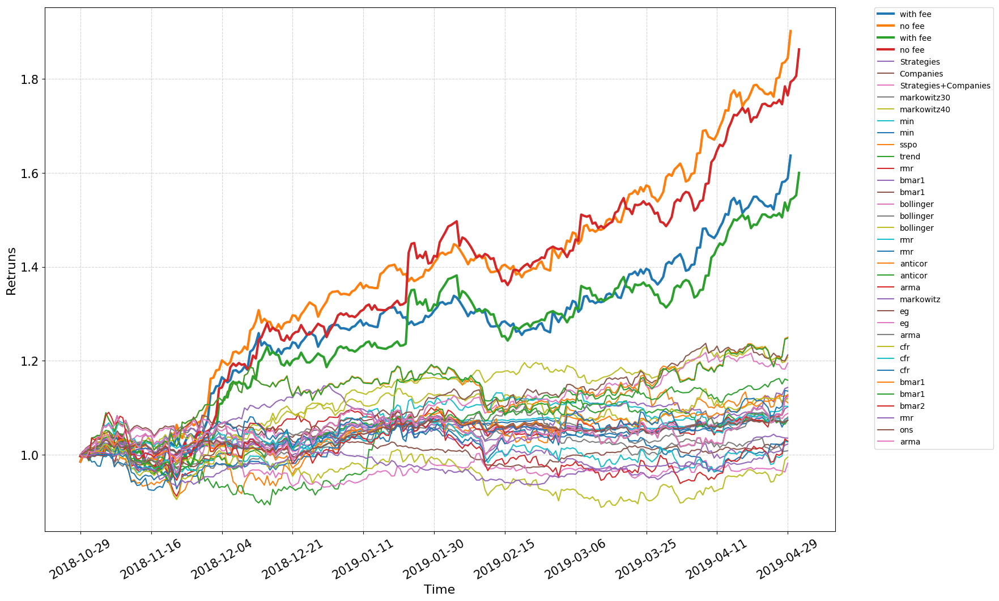

In [123]:
plot_figure = True
for name, res in results_multi.items():
    plot_rl_results(res[0], accumulate_method="cumprod", 
                title="",
                dates=res[1],
                trades_per_day=2, show_flag=False, lw=3, figure_flag=plot_figure)
    plot_figure = False

df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies")
plt.plot(compute_ubah(df_for_ubah[companies]), label="Companies")
plt.plot(compute_ubah(df_for_ubah[all_assets]), label="Strategies+Companies")
for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i], label=strat.split("_")[0])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



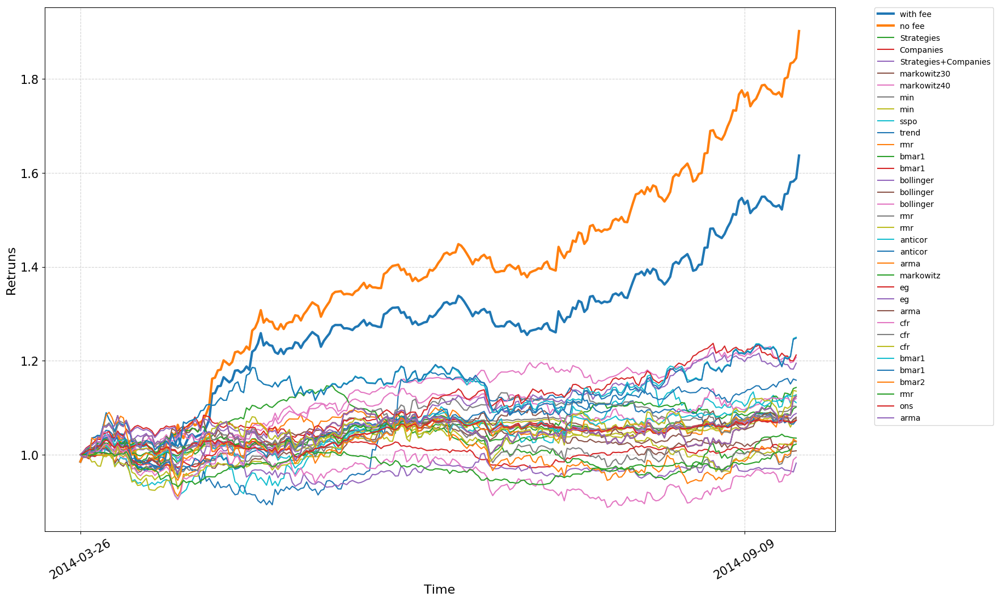

In [121]:
plot_rl_results(results_multi["CNN"][0], accumulate_method="cumprod", 
                title="",
                dates=results_multi["CNN"][1],
                trades_per_day=2, show_flag=False, lw=3)
df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies")
plt.plot(compute_ubah(df_for_ubah[companies]), label="Companies")
plt.plot(compute_ubah(df_for_ubah[all_assets]), label="Strategies+Companies")
for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i], label=strat.split("_")[0])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



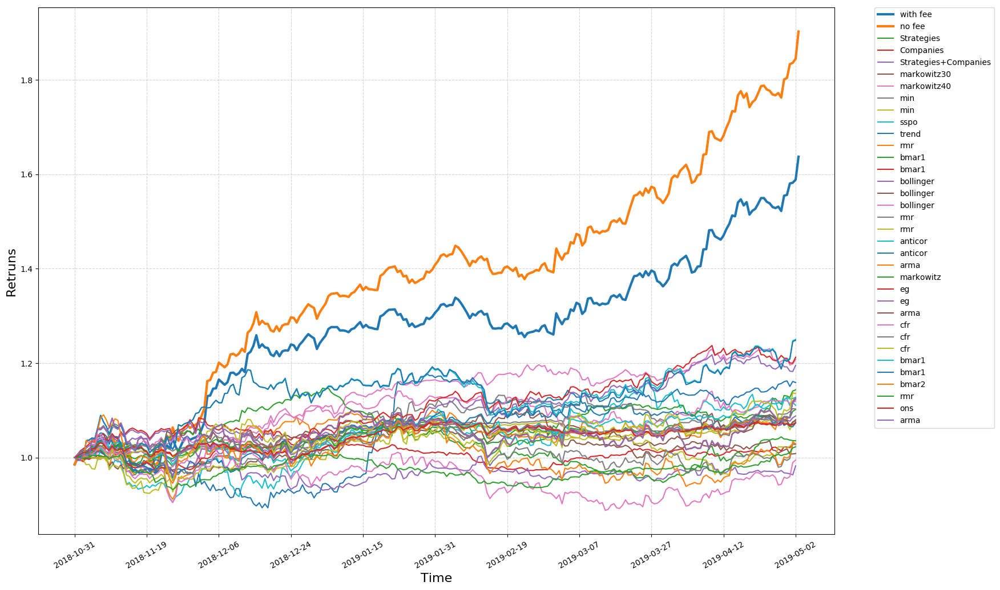

In [62]:
plot_rl_results(res_rl, accumulate_method="cumprod", 
                title="",
                dates=backtester.test_dates,
                trades_per_day=2, show_flag=False, lw=3)
df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies")
plt.plot(compute_ubah(df_for_ubah[companies]), label="Companies")
plt.plot(compute_ubah(df_for_ubah[all_assets]), label="Strategies+Companies")
for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i], label=strat.split("_")[0])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

apv_no_fee: 1.6558204
apv_with_fee: 1.5053521

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



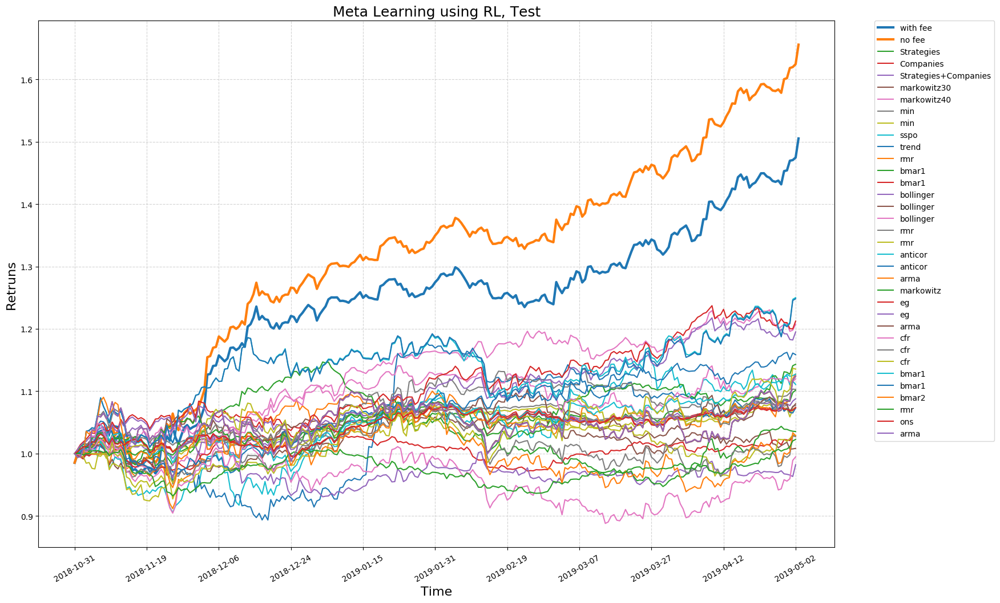

In [64]:
plot_rl_results(res_rl, accumulate_method="cumsum", 
                title="Meta Learning using RL, Test",
                dates=backtester.test_dates,
                trades_per_day=2, show_flag=False, lw=3)
df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies")
plt.plot(compute_ubah(df_for_ubah[companies]), label="Companies")
plt.plot(compute_ubah(df_for_ubah[all_assets]), label="Strategies+Companies")
for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i], label=strat.split("_")[0])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

In [131]:
strategies

['markowitz30_117',
 'markowitz40_117',
 'min_variance30_119',
 'min_variance40_119',
 'sspo_7_109',
 'trend_follow_6_113',
 'rmr_trend_follow_3_91',
 'bmar1_3_top2_79',
 'bmar1_3_top5_79',
 'bollinger_10_110',
 'bollinger_20_110',
 'bollinger_30_110',
 'rmr_trend_follow_95',
 'rmr_trend_follow_2_95',
 'anticor_3_84',
 'anticor_7_84',
 'arma_3_104',
 'markowitz_114',
 'eg_top3_shorts_0_1_96',
 'eg_top3_shorts_1_96',
 'arma_3_105',
 'cfr_ogd3_107',
 'cfr_ogd3_3_3_107',
 'cfr_ons3_3_3_107',
 'bmar1_3_85',
 'bmar1_5_85',
 'bmar2_85',
 'rmr_trend_follow_73',
 'ons_100',
 'arma_108']

In [136]:
[strategies[i] for i in np.argsort(strategy_returns_ubah[-1])[::-1]]

['bmar1_3_85',
 'bmar1_5_85',
 'eg_top3_shorts_0_1_96',
 'markowitz40_117',
 'eg_top3_shorts_1_96',
 'anticor_7_84',
 'bmar1_3_top2_79',
 'cfr_ons3_3_3_107',
 'rmr_trend_follow_3_91',
 'anticor_3_84',
 'arma_3_104',
 'arma_108',
 'arma_3_105',
 'bollinger_30_110',
 'sspo_7_109',
 'rmr_trend_follow_95',
 'bollinger_20_110',
 'min_variance30_119',
 'min_variance40_119',
 'ons_100',
 'trend_follow_6_113',
 'markowitz_114',
 'rmr_trend_follow_2_95',
 'bmar1_3_top5_79',
 'bmar2_85',
 'cfr_ogd3_3_3_107',
 'rmr_trend_follow_73',
 'markowitz30_117',
 'cfr_ogd3_107',
 'bollinger_10_110']

In [137]:
results["bmar1_3_85"]["config"]

NameError: name 'results' is not defined

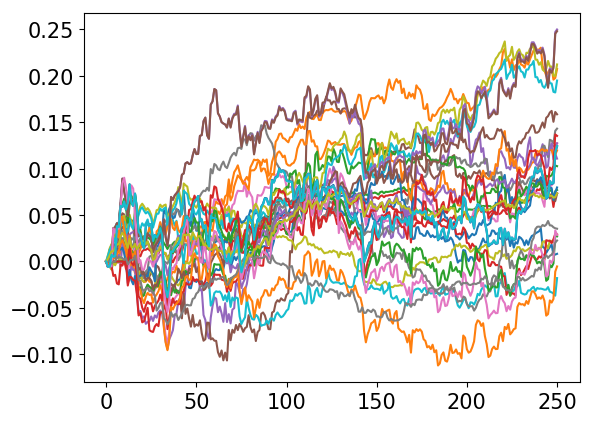

In [129]:
for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i] - 1, label="_".join(strat.split("_")[:-1]))

In [75]:
strategy_returns_ubah

array([[1.       , 1.       , 1.       , ..., 1.       , 1.       ,
        1.       ],
       [1.0011114, 1.0014939, 1.0013572, ..., 0.9997816, 1.0029454,
        0.9941631],
       [1.0122434, 1.0094763, 1.006198 , ..., 0.9997816, 1.0066212,
        0.9944123],
       ...,
       [1.0069282, 1.1960037, 1.0671356, ..., 1.0108014, 1.0687715,
        1.0849546],
       [1.0074385, 1.1978256, 1.0757071, ..., 1.0202718, 1.0694011,
        1.1182582],
       [1.0082306, 1.2074394, 1.077006 , ..., 1.0225786, 1.0733024,
        1.1246176]], dtype=float32)

In [65]:
import matplotlib
label_size = 15
matplotlib.rcParams['xtick.labelsize'] = label_size 
matplotlib.rcParams['ytick.labelsize'] = label_size

In [81]:
np.cumprod(res_rl[0])

array([0.98511624, 0.9988439 , 1.0038563 , 0.99843615, 0.9982244 ,
       0.9976271 , 1.0109098 , 1.008682  , 1.0128895 , 1.0119568 ,
       1.0083046 , 1.0331709 , 1.0355592 , 1.0354804 , 1.0196917 ,
       1.0268375 , 1.0196189 , 1.0163643 , 1.0211592 , 0.9962102 ,
       0.9719621 , 0.973876  , 0.96919405, 0.96596086, 0.9728871 ,
       0.9769144 , 0.9758065 , 0.97378284, 0.96719074, 0.97335917,
       1.0061673 , 1.0095435 , 1.0257394 , 1.0184917 , 1.0417494 ,
       1.0227793 , 1.0129987 , 1.0269775 , 1.0396924 , 1.0436493 ,
       1.0371162 , 1.0403221 , 1.0425544 , 1.0464396 , 1.0595042 ,
       1.0747871 , 1.1298789 , 1.1312814 , 1.1457012 , 1.1465081 ,
       1.165045  , 1.1596099 , 1.1540111 , 1.1593696 , 1.1789246 ,
       1.1797951 , 1.1748233 , 1.1787575 , 1.1878966 , 1.1808637 ,
       1.2192256 , 1.2239997 , 1.2367865 , 1.2588673 , 1.2326074 ,
       1.2396876 , 1.2331324 , 1.2318887 , 1.2182866 , 1.2147988 ,
       1.2251252 , 1.2144395 , 1.2247424 , 1.2269214 , 1.22645

In [95]:
results_meta = {}
results_meta["meta_rl"] = {"returns_with_fee": res_rl[0]}
for i, strat in enumerate(strategies):
    x = strategy_returns_ubah[:, i]
    results_meta[strat] = {}
    results_meta[strat]["returns_with_fee"] = x[1:] / x[:-1]

In [96]:
def max_drawdown(data):
    index_j = np.argmax(np.maximum.accumulate(data) - data)
    if index_j == 0:
        return 0
    index_i = np.argmax(data[:index_j])
    d = (data[index_i] - data[index_j]) 
    return d

In [107]:
def compute_returns(results, fee, flag=False, threshold_final_ret=-10, 
                    threshold_sharpe=-10, is_cumulative=True, trades_per_day=3):
    best_results = {}
    best_results_metrics = {}
    for agent, res in results.items():
        
        if flag:
            ret_with_fee_by_step = res["returns_with_fee"]
        else:
            fee_values = res["turnover"] * fee
            ret_values = res["returns_no_fee"]
            ret_with_fee_by_step = ret_values - fee_values
        if is_cumulative:
            ret_with_fee = np.cumprod(ret_with_fee_by_step)
            #ret_no_fee = np.cumprod(ret_values)
        else:
            ret_with_fee = np.cumsum(ret_with_fee_by_step - 1) + 1
            #ret_no_fee = np.cumsum(ret_values - 1) + 1

        sharpe_with_fee = np.mean(ret_with_fee_by_step - 1) / \
                            np.std(ret_with_fee_by_step) * (252 * trades_per_day)**0.5
        #sharpe_no_fee = np.mean(ret_values - 1) / \
        #                    np.std(ret_values) * (252 * trades_per_day)**0.5
        if sharpe_with_fee > threshold_sharpe and ret_with_fee[-1] > threshold_final_ret:
            best_results_metrics[agent] = {
                "final_return": ret_with_fee[-1],
                "apy": ret_with_fee[-1]**(1 / (ret_with_fee.shape[0] / (trades_per_day * 252))) - 1,
                "sharpe": sharpe_with_fee,
                "mdd": max_drawdown(ret_with_fee),
                #"avg_turnover": np.mean(res["turnover"]),
                "volatility": np.std(ret_with_fee_by_step)
            }
            best_results[agent] = {
                "ret_with_fee": ret_with_fee,
                "ret_no_fee": ret_with_fee
            }
        if agent == "crp_121":
            best_results_metrics[agent] = {
                "ret_with_fee": ret_with_fee,
                "ret_no_fee": ret_no_fee,
                "sharpe_with_fee": sharpe_with_fee,
                "sharpe_no_fee": sharpe_no_fee
            }
    return best_results, best_results_metrics

In [108]:
best_results, best_results_metrics = compute_returns(results_meta, 3e-4, flag=True, trades_per_day=2, is_cumulative=True)

In [109]:
metrics = ['sharpe', 'final_return', 'apy', 'mdd', 'volatility']

In [110]:
for i, (name, values) in enumerate(sorted(best_results_metrics.items(), reverse=False)):
    if name.split("_")[-1] == "top3":
        table_str = " %s Top-3 " % "_".join(name.split("_")[:-1])
    else:
        table_str = " %s " % " ".join(name.split("_")[:-1])
    for metric in metrics:
        if metric == "volatility":
            value_str = " %.4f" % values[metric]
        else:
            value_str = " %.2f" % values[metric]
        table_str += ("& " + value_str)
    if i % 2 == 1:
        pass
        print(table_str, "\\\\")
    else:
        print(table_str, "\\\\")

 anticor 3 &  1.92&  1.13&  0.27&  0.08&  0.0058 \\
 anticor 7 &  2.04&  1.16&  0.35&  0.09&  0.0067 \\
 arma &  1.11&  1.12&  0.27&  0.12&  0.0106 \\
 arma 3 &  1.11&  1.12&  0.27&  0.12&  0.0106 \\
 arma 3 &  1.11&  1.12&  0.27&  0.12&  0.0106 \\
 bmar1 3 &  2.13&  1.25&  0.57&  0.10&  0.0100 \\
 bmar1 3 top2 &  2.11&  1.14&  0.31&  0.12&  0.0059 \\
 bmar1 3 top5 &  0.72&  1.03&  0.06&  0.08&  0.0038 \\
 bmar1 5 &  2.11&  1.25&  0.56&  0.11&  0.0099 \\
 bmar2 &  0.35&  1.03&  0.06&  0.15&  0.0111 \\
 bollinger 10 &  -0.15&  0.98&  -0.04&  0.12&  0.0071 \\
 bollinger 20 &  1.05&  1.08&  0.17&  0.08&  0.0071 \\
 bollinger 30 &  1.55&  1.12&  0.26&  0.08&  0.0069 \\
 cfr ogd3 &  0.07&  0.99&  -0.01&  0.16&  0.0105 \\
 cfr ogd3 3 3 &  0.35&  1.03&  0.06&  0.12&  0.0102 \\
 cfr ons3 3 3 &  1.25&  1.14&  0.29&  0.10&  0.0100 \\
 eg top3 shorts 0 1 &  2.73&  1.21&  0.47&  0.06&  0.0065 \\
 eg top3 shorts 1 &  2.56&  1.19&  0.43&  0.06&  0.0064 \\
 markowitz30 &  0.19&  1.01&  0.02&  0.07&  

In [73]:
res_rl

(array([0.98511624, 1.0139351 , 1.0050182 , 0.99460065, 0.99978787,
        0.9994016 , 1.0133144 , 0.99779624, 1.0041713 , 0.99907917,
        0.9963909 , 1.0246615 , 1.0023116 , 0.9999239 , 0.9847523 ,
        1.0070077 , 0.9929701 , 0.99680805, 1.0047176 , 0.975568  ,
        0.9756596 , 1.0019691 , 0.99519247, 0.99666405, 1.0071703 ,
        1.0041395 , 0.9988659 , 0.9979262 , 0.9932304 , 1.0063777 ,
        1.0337061 , 1.0033555 , 1.0160428 , 0.9929342 , 1.0228354 ,
        0.98179024, 0.9904372 , 1.0137994 , 1.0123808 , 1.0038059 ,
        0.9937401 , 1.0030912 , 1.0021458 , 1.0037267 , 1.0124847 ,
        1.0144247 , 1.0512583 , 1.0012413 , 1.0127465 , 1.0007043 ,
        1.0161681 , 0.9953348 , 0.99517184, 1.0046433 , 1.0168669 ,
        1.0007385 , 0.99578583, 1.0033488 , 1.0077531 , 0.9940796 ,
        1.0324863 , 1.0039157 , 1.0104467 , 1.0178534 , 0.9791401 ,
        1.0057441 , 0.99471223, 0.99899143, 0.9889584 , 0.9971371 ,
        1.0085005 , 0.9912779 , 1.0084836 , 1.00

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



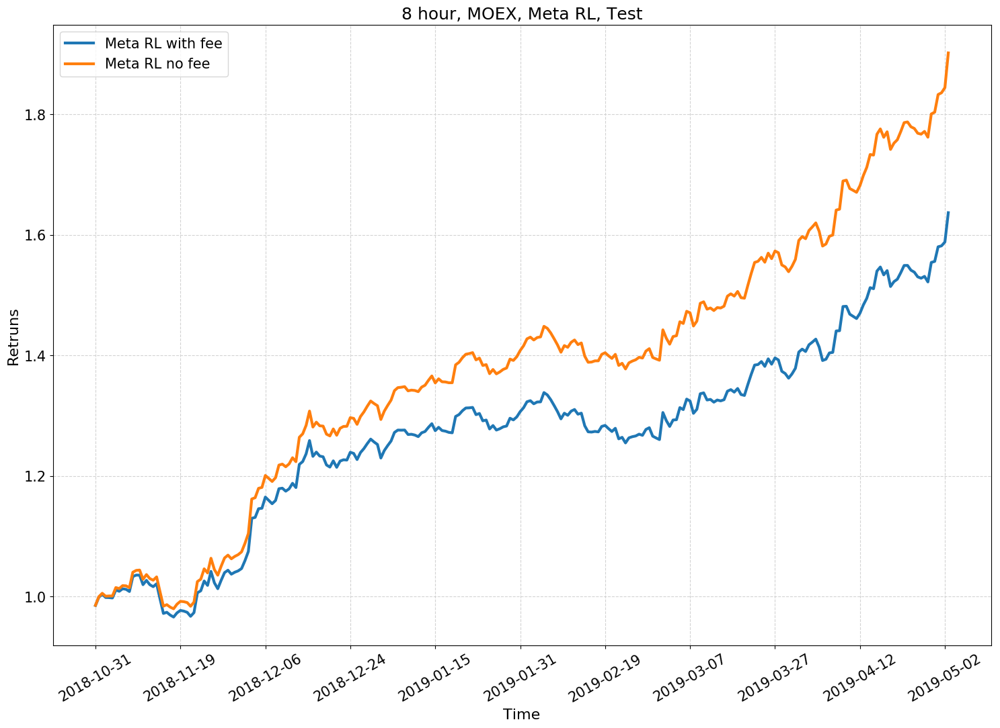

In [115]:
plot_rl_results(res_rl, accumulate_method="cumprod", plot_no_fee=False,
                title="8 hour, MOEX, Meta RL, Test",
                dates=backtester.test_dates, 
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL ")
plot_rl_results(res_rl, accumulate_method="cumprod", plot_no_fee=True, plot_with_fee=False,
                title="8 hour, MOEX, Meta RL, Test",
                dates=backtester.test_dates, 
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL ", figure_flag=False)

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



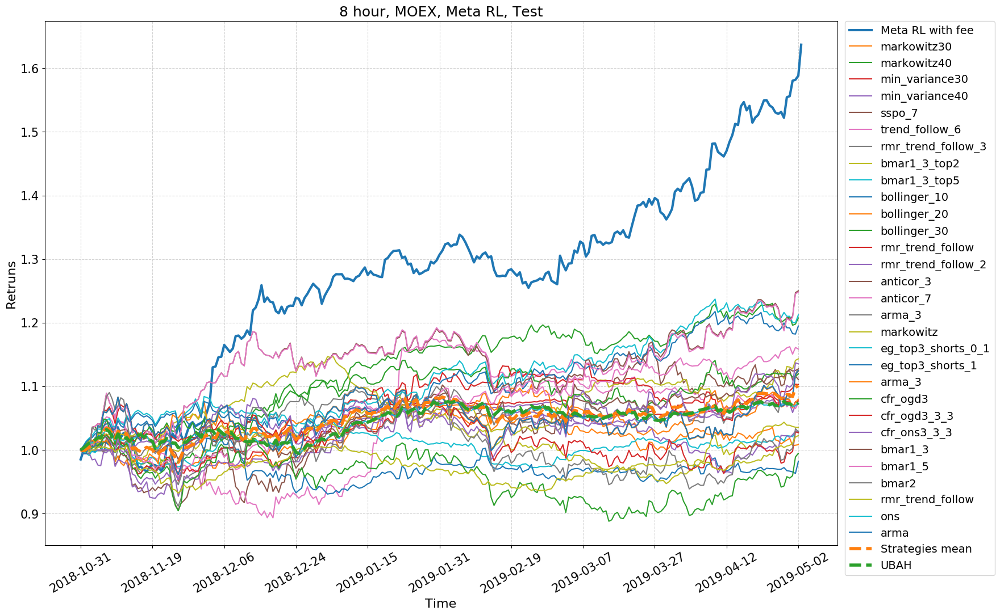

In [70]:
plot_rl_results(res_rl, accumulate_method="cumprod", plot_no_fee=False,
                title="8 hour, MOEX, Meta RL, Test",
                dates=backtester.test_dates, 
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL ")

for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i] , label="_".join(strat.split("_")[:-1]))

df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies mean", lw=4, linestyle="--")
plt.plot(compute_ubah(df_for_ubah[companies]), label="UBAH", lw=4, linestyle="--")
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., prop={"size": 14})
plt.show()

In [72]:
plot_rl_results(res_rl, accumulate_method="cumprod", plot_no_fee=False,
                title="8 hour, MOEX, Meta RL, Test",
                dates=backtester.test_dates, 
                trades_per_day=2, show_flag=False, lw=3, 
                returns_percents_flag=False,
               strat_label="Meta RL ")

for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i] , label="_".join(strat.split("_")[:-1]))

df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]), label="Strategies mean", lw=4, linestyle="--")
plt.plot(compute_ubah(df_for_ubah[companies]), label="UBAH", lw=4, linestyle="--")
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., prop={"size": 14})
save_path = "/home/ubuntu/kolomeytsev/plots/meta_rl_cnn_3"
plt.savefig(save_path + ".eps", bbox_inches='tight')
#plt.savefig(save_path + ".png", bbox_inches='tight')
plt.close()

apv_no_fee: 1.9021323
apv_with_fee: 1.6369913

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



In [71]:
plot_rl_results(res_rl, accumulate_method="cumsum", 
                title="Meta RL, Test, mean ret loss, 8 hour, MOEX",
                dates=backtester.test_dates,
                trades_per_day=2, show_flag=False, lw=4, 
                returns_percents_flag=True,
               strat_label="Meta RL ")

for i, strat in enumerate(strategies):
    plt.plot(strategy_returns_ubah[:, i] - 1, label="_".join(strat.split("_")[:-1]))

df_for_ubah = panel["close"].T[panel["close"].T.index > "2018-10-31 10:00:00"]
plt.plot(compute_ubah(df_for_ubah[strategies]) - 1, label="Strategies mean", lw=4, linestyle="--")
plt.plot(compute_ubah(df_for_ubah[companies]) - 1, label="UBAH", lw=4, linestyle="--")
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0., prop={"size": 14})
#plt.show()
save_path = "/home/ubuntu/kolomeytsev/plots/mean_ret_loss_test_8_hour_meta_rl_test"
plt.savefig(save_path + ".eps", bbox_inches='tight')
#plt.savefig(save_path + ".png", bbox_inches='tight')
plt.close()

apv_no_fee: 0.655820369720459
apv_with_fee: 0.5053521394729614

sharpe_no_fee: 5.956188469371778
sharpe_with_fee: 4.593552467929703



## Train + Test

['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'GAZP', 'SIBN', 'MOEX', 'IRAO', 'markowitz30_117', 'markowitz40_117', 'min_variance30_119', 'min_variance40_119', 'sspo_7_109', 'trend_follow_6_113', 'rmr_trend_follow_3_91', 'bmar1_3_top2_79', 'bmar1_3_top5_79', 'bollinger_10_110', 'bollinger_20_110', 'bollinger_30_110', 'rmr_trend_follow_95', 'rmr_trend_follow_2_95', 'anticor_3_84', 'anticor_7_84', 'arma_3_104', 'markowitz_114', 'eg_top3_shorts_0_1_96', 'eg_top3_shorts_1_96', 'arma_3_105', 'cfr_ogd3_107', 'cfr_ogd3_3_3_107', 'cfr_ons3_3_3_107', 'bmar1_3_85', 'bmar1_5_85', 'bmar2_85', 'rmr_trend_follow_73', 'ons_100', 'arma_108']
Reading data: 1392336000 1556841600 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 60, 2628)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f224dc5f390>


/home/ds/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:128: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel_combined(df, self.coins_list, self.__start, self.__end)


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/combined/hour_8/win_10/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/combined/hour_8/win_10/1/netfile


days number: 1295.0
apv_no_fee: 9.154596
apv_with_fee: 7.612248

sharpe_no_fee: 4.073867435660336
sharpe_with_fee: 3.305011569149169



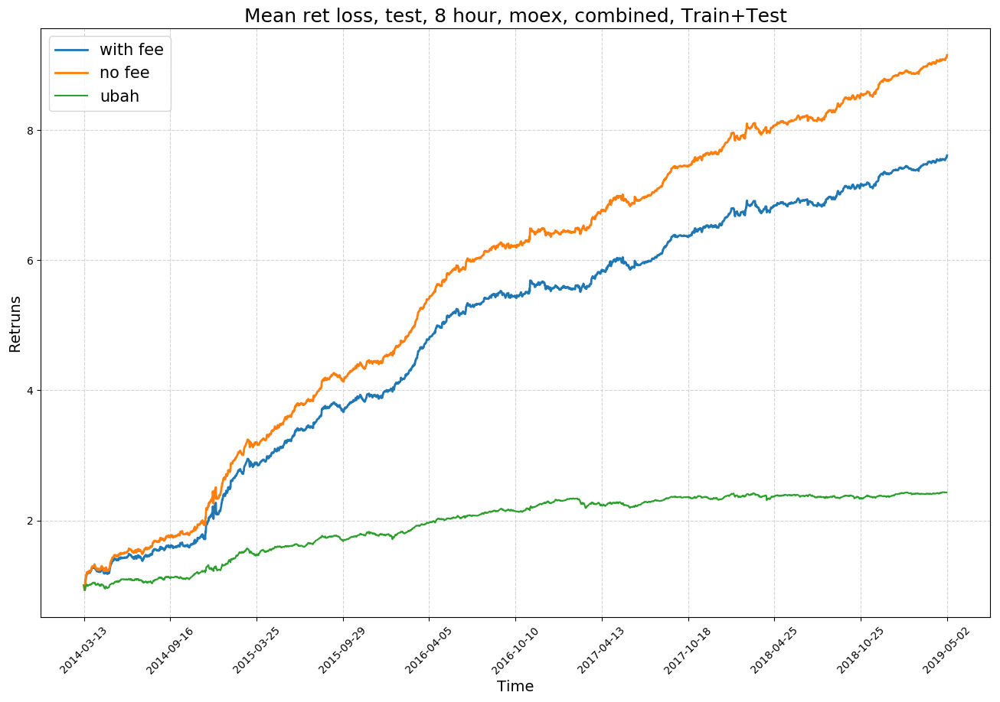

ERROR:sqlalchemy.pool.QueuePool:Exception during reset or similar
Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/base.py", line 704, in _rollback_impl
    self.engine.dialect.do_rollback(self.connection)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/default.py", line 459, in do_rollback
    dbapi_connection.rollback()
psycopg2.OperationalError: server closed the connection unexpectedly
	This probably means the server terminated abnormally
	before or while processing the request.


The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 709, in _finalize_fairy
    fairy._reset(pool)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 878, in _reset
    self._reset_agent.rollback()
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/base.p

In [73]:
path = "/combined/hour_8/win_10/1/"
backtester, res_rl = process_results(path, 0.99, "Mean ret loss, test, 8 hour, moex, combined, Train+Test", 
                                     fee=3e-4, trades_per_day=2,
                                    path_start = "/home/ds/kolomeytsev/rl_server_moex", 
                                     start='2014/02/14', end='2019/05/03', accumulate_method="cumsum")

['CHMF', 'TATN', 'LKOH', 'ROSN', 'SBER', 'MGNT', 'ALRS', 'GMKN', 'SNGS', 'NVTK', 'MAGN', 'GAZP', 'MOEX', 'VTBR', 'MTSS']
Reading data: 1422748800 1556841600 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 15, 2144)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f770e340b38>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_8/companies_15/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_8/companies_15/1/netfile


days number: 24.75
apv_no_fee: 1.2701051
apv_with_fee: 1.2270648

sharpe_no_fee: 6.978321528809881
sharpe_with_fee: 5.860112722818959



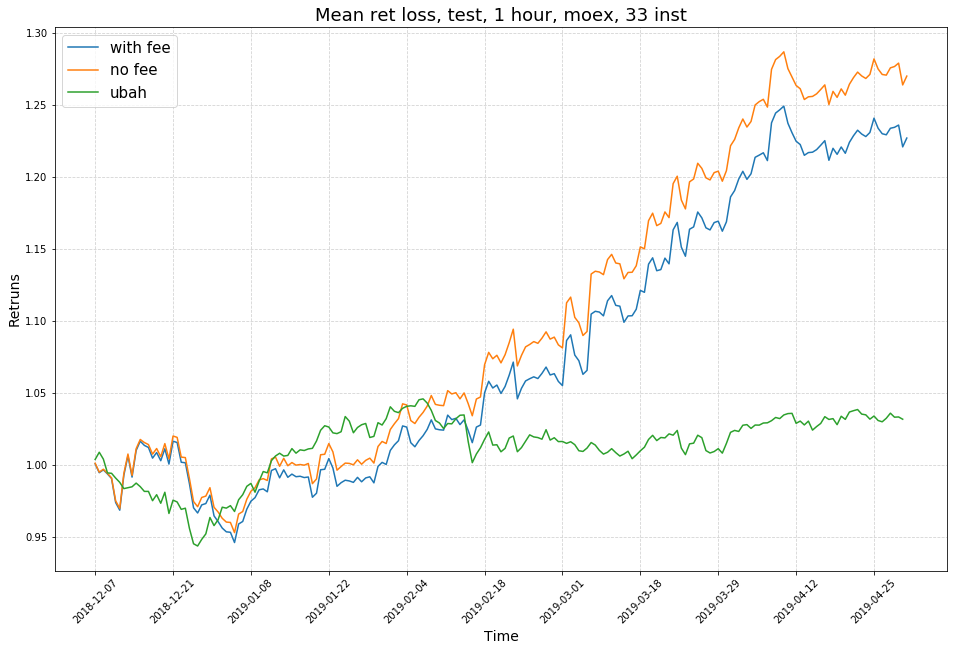

ERROR:sqlalchemy.pool.QueuePool:Exception during reset or similar
Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/base.py", line 704, in _rollback_impl
    self.engine.dialect.do_rollback(self.connection)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/default.py", line 459, in do_rollback
    dbapi_connection.rollback()
psycopg2.errors.OperatorIntervention: unable to read data
DETAIL:  child connection forced to terminate due to client_idle_limit:1000 is reached
server closed the connection unexpectedly
	This probably means the server terminated abnormally
	before or while processing the request.


The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 709, in _finalize_fairy
    fairy._reset(pool)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 878, i

In [329]:
path = "/companies_amount/hour_8/companies_15/1/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 1 hour, moex, 33 inst", 
                                     fee=4e-4, trades_per_day=8,
                                    path_start = "/home/ds/kolomeytsev/rl_server_moex", 
                                     start='2015/02/01', end='2019/05/03')

['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'MTLR', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'AFKS', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'YNDX', 'GAZP', 'SIBN', 'MOEX', 'IRAO']
Reading data: 1422748800 1556841600 3600 ['close', 'high', 'low']
periods:  3600 3600
global_data shape:  (3, 33, 9648)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f77131e2240>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_1/companies_33/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_1/companies_33/1/netfile


days number: 118.5
apv_no_fee: 1.8441857
apv_with_fee: 1.371195

sharpe_no_fee: 6.858466034739825
sharpe_with_fee: 3.0202443757538777



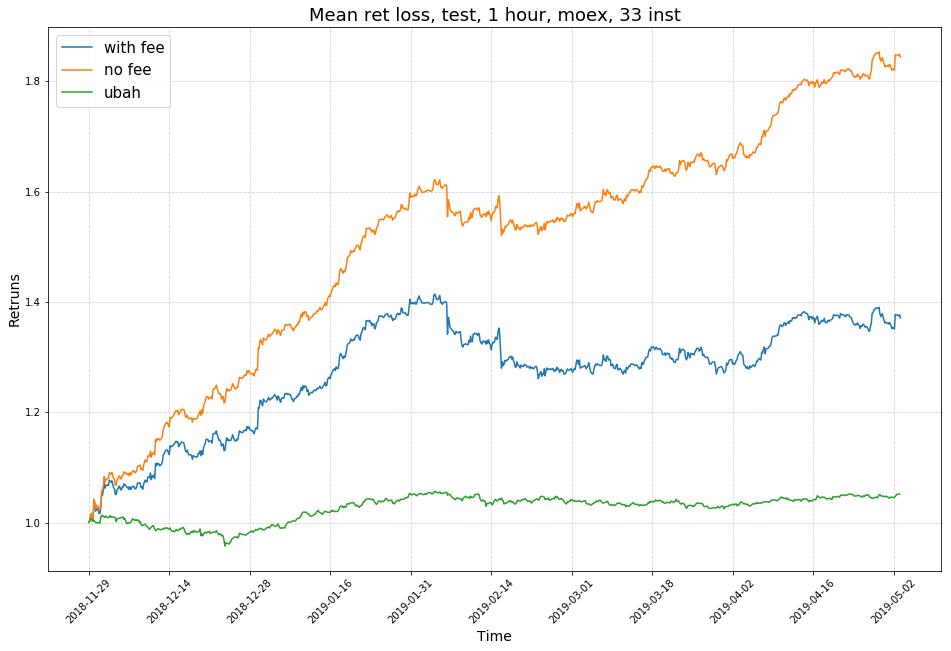

ERROR:sqlalchemy.pool.QueuePool:Exception during reset or similar
Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/base.py", line 704, in _rollback_impl
    self.engine.dialect.do_rollback(self.connection)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/default.py", line 459, in do_rollback
    dbapi_connection.rollback()
psycopg2.errors.OperatorIntervention: unable to read data
DETAIL:  child connection forced to terminate due to client_idle_limit:1000 is reached
server closed the connection unexpectedly
	This probably means the server terminated abnormally
	before or while processing the request.


The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 709, in _finalize_fairy
    fairy._reset(pool)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 878, i

In [328]:
path = "/companies_amount/hour_1/companies_33/1/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 1 hour, moex, 33 inst", 
                                     fee=4e-4, trades_per_day=8,
                                    path_start = "/home/ds/kolomeytsev/rl_server_moex", 
                                     start='2015/02/01', end='2019/05/03')

## hour 8

['CHMF', 'TATN', 'LKOH', 'ROSN', 'SBER', 'MGNT', 'ALRS', 'GMKN', 'SNGS', 'NVTK', 'MAGN', 'GAZP', 'MOEX', 'VTBR', 'MTSS']
Reading data: 1422748800 1556841600 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 15, 2144)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f762816c748>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_8/companies_15/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_8/companies_15/1/netfile


days number: 99.0
apv_no_fee: 1.2675242
apv_with_fee: 1.2274635

sharpe_no_fee: 3.6956080727489105
sharpe_with_fee: 3.139905173224769



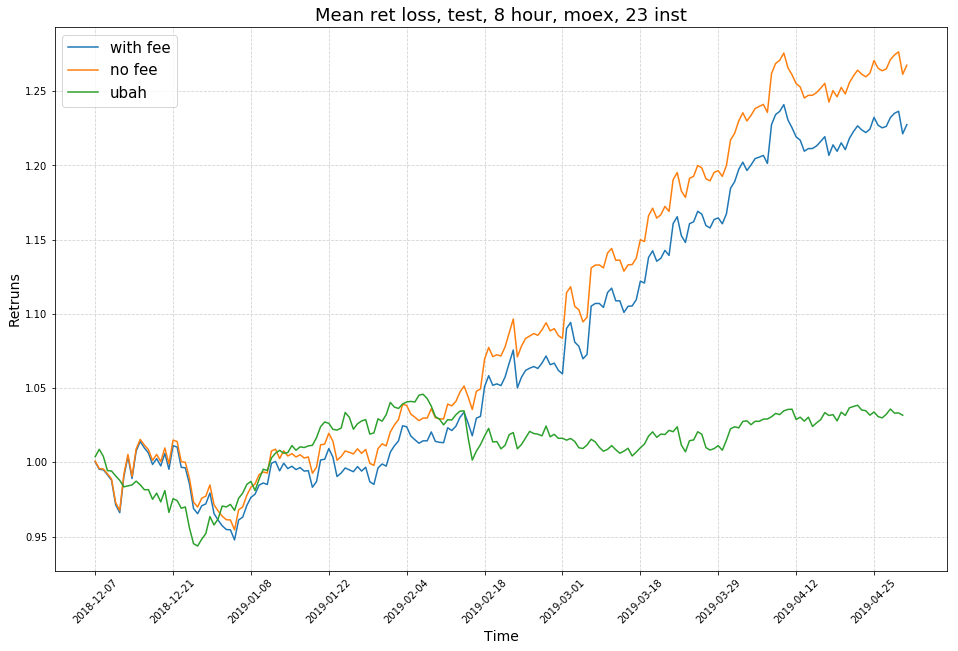

In [320]:
path = "/companies_amount/hour_8/companies_15/1/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2,
                                    path_start = "/home/ds/kolomeytsev/rl_server_moex", 
                                     start='2015/02/01', end='2019/05/03')

['FEES', 'PLZL', 'LKOH', 'ROSN', 'GMKN', 'POLY', 'MAGN', 'RSTI', 'MGNT', 'ALRS', 'MSNG', 'NVTK', 'MVID', 'HYDR', 'RTKM', 'MTLR', 'VTBR', 'PHOR', 'CHMF', 'AFLT', 'AFKS', 'SNGS', 'MTSS', 'RASP', 'MFON', 'NLMK', 'TATN', 'SBER', 'YNDX', 'GAZP', 'SIBN', 'MOEX', 'IRAO']
Reading data: 1422748800 1556841600 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 33, 2144)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75c0008240>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_8/companies_33/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/companies_amount/hour_8/companies_33/1/netfile


days number: 99.0
apv_no_fee: 1.2768791
apv_with_fee: 1.2279487

sharpe_no_fee: 3.7688303860166004
sharpe_with_fee: 3.107328284009529



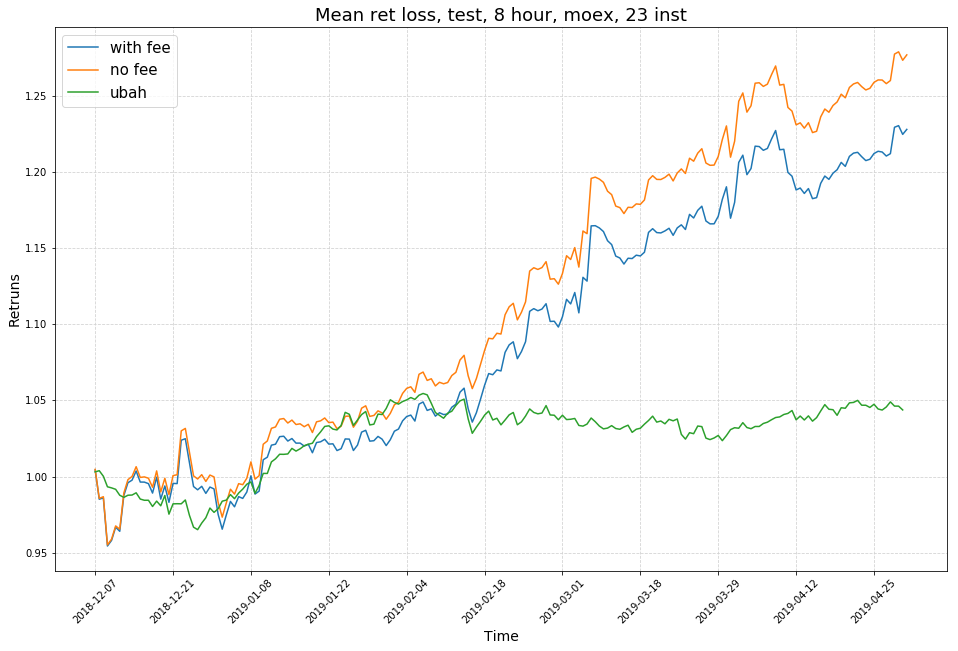

In [319]:
path = "/companies_amount/hour_8/companies_33/1/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2,
                                    path_start = "/home/ds/kolomeytsev/rl_server_moex", 
                                     start='2015/02/01', end='2019/05/03')

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1391731200 1546041600 28800 ['close', 'high', 'low', 'revenue/share', 'est_sales', 'ps_ratio', 'share', 'eps', 'est_net_income', 'cashflow_op', 'enterprise_value', 'est_ebitda', 'return_equity', 'debt/equity', 'debt', 'debt/assets', 'debt_lt', 'revenue', 'est_eps', 'debt_st']
periods:  28800 28800
global_data shape:  (20, 23, 2470)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f7628104f28>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/notebooks/rl/rl_train_packages/rl_test_low_nan_20/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/notebooks/rl/rl_train_packages/rl_test_low_nan_20/1/netfile


days number: 1182.0
apv_no_fee: 2.110214
apv_with_fee: 2.1098156

sharpe_no_fee: 0.9464122234470245
sharpe_with_fee: 0.9460663191797797



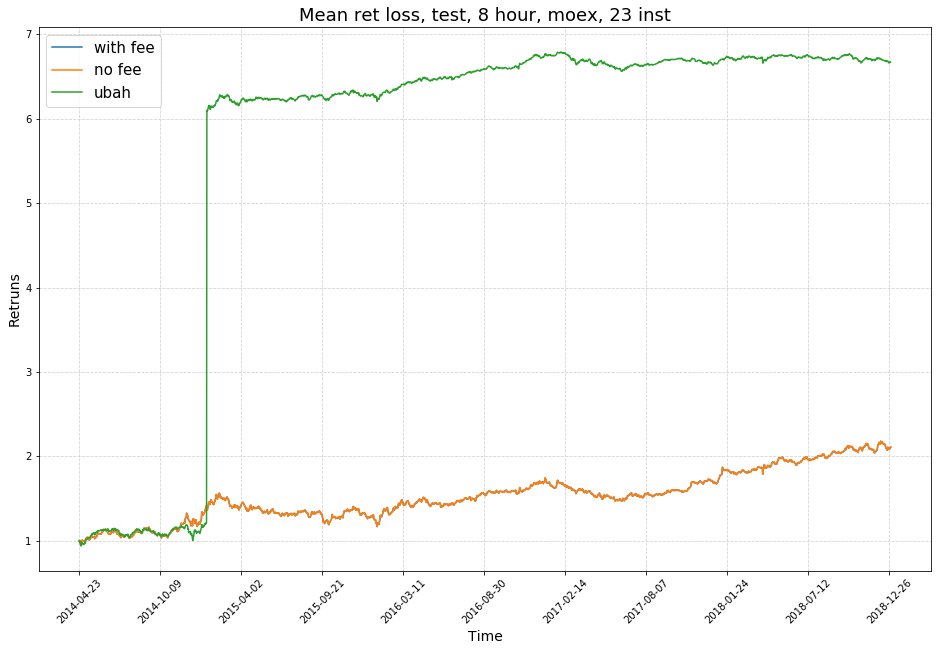

In [246]:
path = "/rl_train_packages/rl_test_low_nan_20/1/"
backtester, res_rl = process_results(path, 0.97, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2,
                                    path_start = "/home/ds/kolomeytsev/notebooks/rl", 
                                     start='2014/02/07', end='2018/12/29')

## test 0.2

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1389052800 1546041600 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 23, 2514)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f77132cbc18>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_80k_test_0_2_win_15_feat_3_lr_0_0005/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_80k_test_0_2_win_15_feat_3_lr_0_0005/1/netfile


days number: 1211.0
apv_no_fee: 3.4491656
apv_with_fee: 2.930418

sharpe_no_fee: 1.2512589253847044
sharpe_with_fee: 0.986769115168238



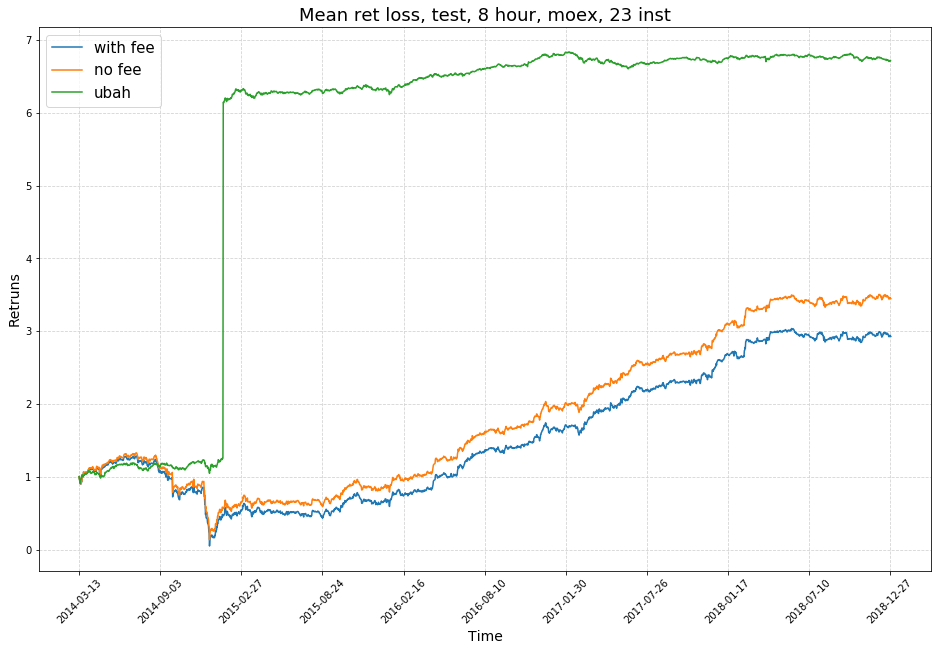

In [253]:
path = "/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_80k_test_0_2_win_15_feat_3_lr_0_0005/1/"
backtester, res_rl = process_results(path, 0.97, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2,
                                     start='2014/01/07', end='2018/12/29')

In [255]:
companies_prices = backtester._rolling_trainer.test_set["X"][:,0,:,-1]
companies_returns = companies_prices[1:] / companies_prices[:-1]
ubah = np.cumsum(companies_returns.mean(1) - 1) + 1
print("days number:", ubah.shape[0] / 2)

days number: 1211.0


## Fix split IRAO

In [286]:
returns = companies_prices[1:] / companies_prices[:-1]

In [293]:
np.argwhere(returns > 10.5)

array([[430,  19]])

In [294]:
companies[19]

'IRAO'

In [301]:
coef = companies_prices[431, 19] / companies_prices[430, 19]

In [302]:
companies_prices[:431, 19] *= coef

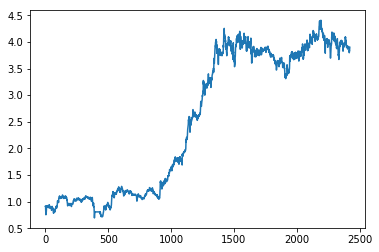

In [303]:
plt.plot(companies_prices[:, 19])

In [278]:
np.argwhere( companies_returns.mean(1) > 2)

array([[430]])

In [257]:
ubah

array([1.0048906 , 0.9677502 , 0.93063956, ..., 6.710741  , 6.720659  ,
       6.715098  ], dtype=float32)

## test 0.1

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 23, 1684)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75784757f0>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_80k_test_0_1_win_15_feat_3_lr_0_0005/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_80k_test_0_1_win_15_feat_3_lr_0_0005/1/netfile


days number: 76.0
apv_no_fee: 1.3175608
apv_with_fee: 1.2798002

sharpe_no_fee: 5.880272184088496
sharpe_with_fee: 5.1999393749216525



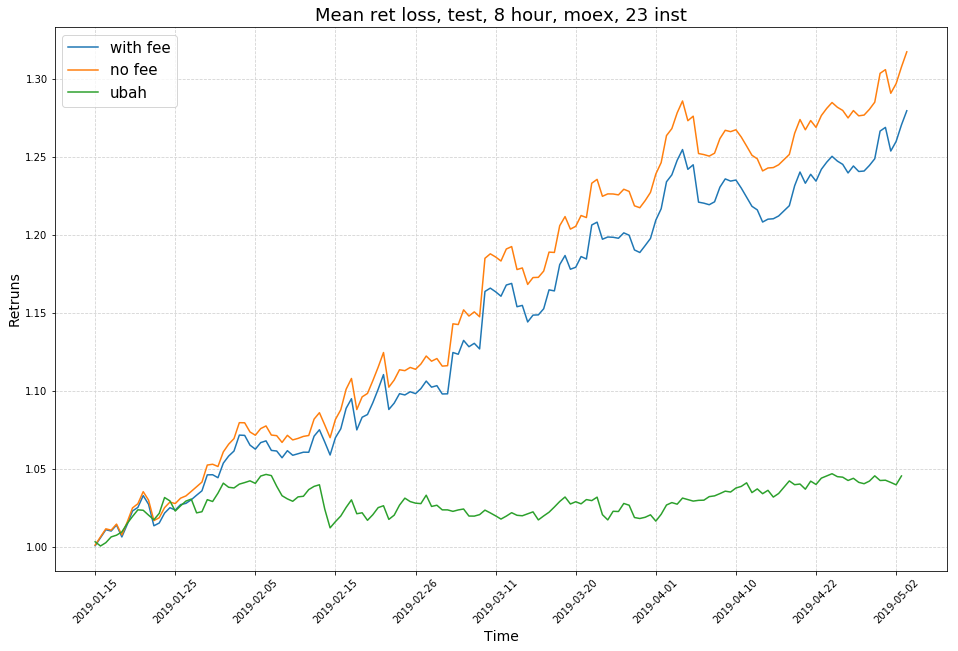

In [225]:
path = "/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_80k_test_0_1_win_15_feat_3_lr_0_0005/1/"
backtester, res_rl = process_results(path, 0.1, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 23, 1684)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75784ba0b8>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/netfile


days number: 50.5
apv_no_fee: 1.2386181
apv_with_fee: 1.2118332

sharpe_no_fee: 5.8645679965434905
sharpe_with_fee: 5.234146764522338



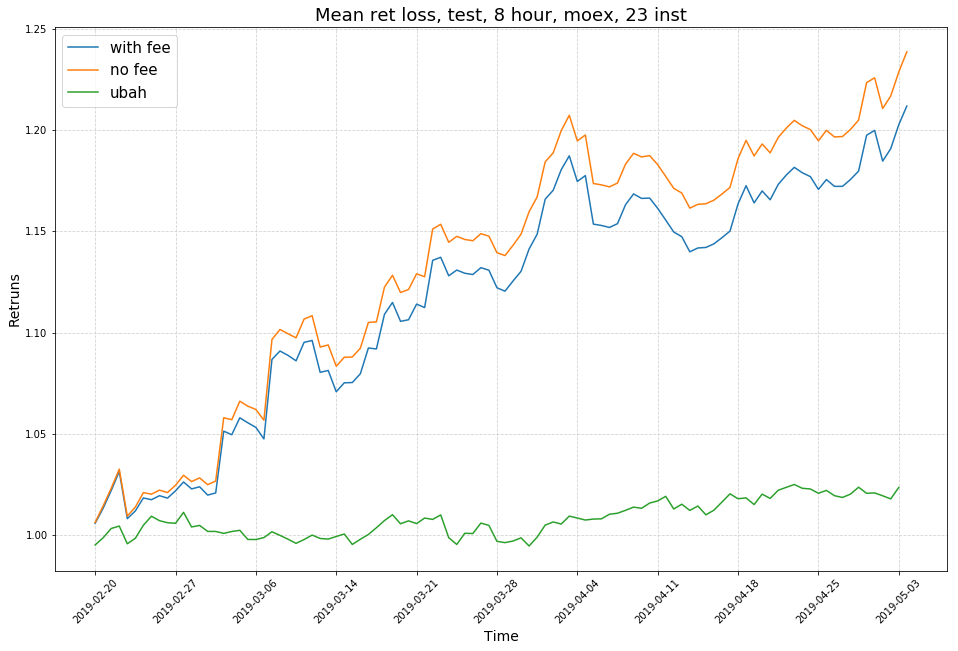

In [224]:
path = "/moex_train_package_hour_8_2016/moex_train_package_\
2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/"
backtester, res_rl = process_results(path, 0.07, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 23, 1684)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75e83d6c88>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/netfile


days number: 808.5
apv_no_fee: 4.1845627
apv_with_fee: 3.760003

sharpe_no_fee: 3.1993046970122347
sharpe_with_fee: 2.7753745967963757



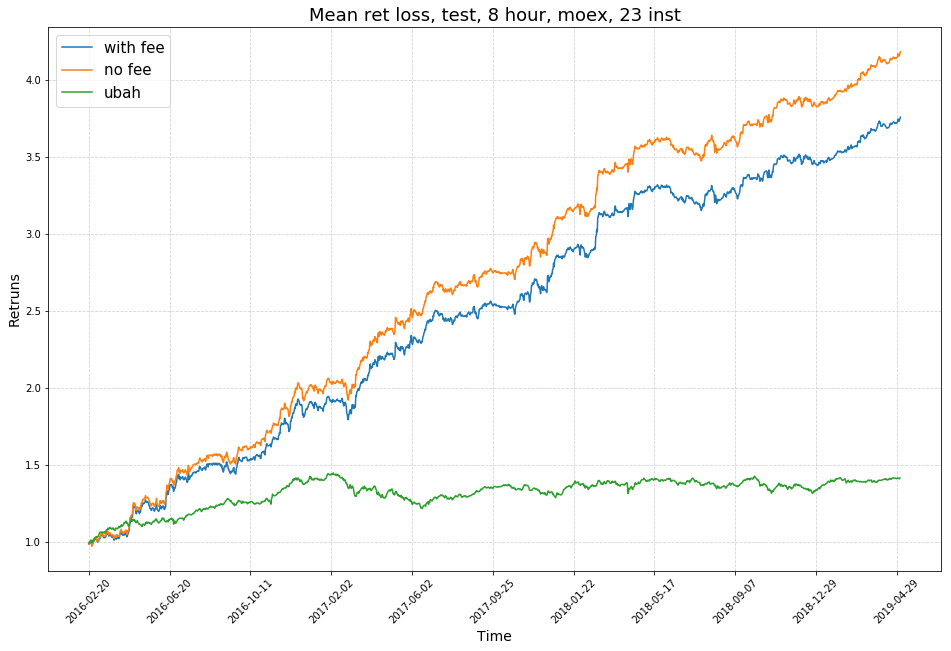

In [215]:
path = "/moex_train_package_hour_8_2016/moex_train_package_\
2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/"
backtester, res_rl = process_results(path, 0.97, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

In [226]:
agents = ["rmr", "olmar", "crp", "ons"]

path = "/home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/"
config = load_config(path + "net_config.json")

config["input"]["start_date"] = '2016/01/01'
config["input"]["end_date"] = '2019/05/06'
config["input"]["test_portion"] = 0.1
config["trading"]["trading_consumption"] = 0.0004

multiple_results = []
for agent in agents:
    res = run_backtest_traditional(agent)
    multiple_results.append(res)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557100800 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 23, 1684)
['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557100800 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 23, 1684)
['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557100800 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 23, 1684)
['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 

rmr
apv_no_fee: 1.1304626
apv_with_fee: 1.0548625

sharpe_no_fee: 1.5433200668189353
sharpe_with_fee: 0.6516845938533027

olmar
apv_no_fee: 1.0864055
apv_with_fee: 1.012748

sharpe_no_fee: 1.0242544943604857
sharpe_with_fee: 0.15203864138745551

crp
apv_no_fee: 1.0453855
apv_with_fee: 1.0447134

sharpe_no_fee: 1.25896333820944
sharpe_with_fee: 1.2410531791900652

ons
apv_no_fee: 1.0537034
apv_with_fee: 1.0493388

sharpe_no_fee: 1.4753202685274176
sharpe_with_fee: 1.357140587672632

rl
apv_no_fee: 1.3175608
apv_with_fee: 1.2798002

sharpe_no_fee: 4.157980336591606
sharpe_with_fee: 3.6769123937660373



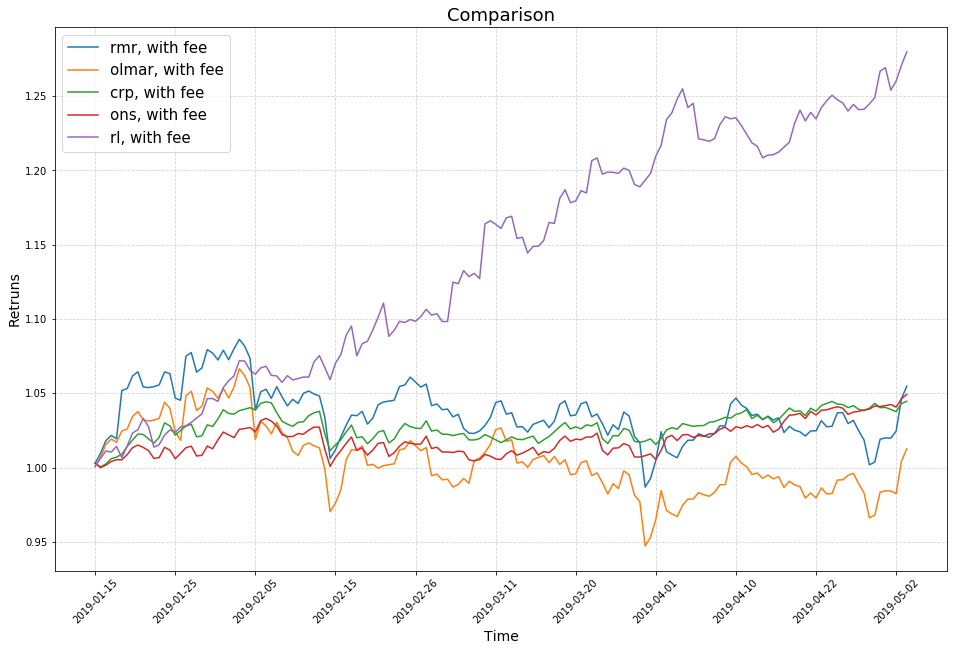

In [227]:
agents.append("rl")
multiple_results.append(res_rl)

plot_multiple_results(multiple_results, agents, plot_no_fee=False, plot_with_fee=True,
                    accumulate_method="cumsum", title="Comparison",
                    dates=backtester.test_dates)

In [233]:
agents = ["rmr", "olmar", "crp", "ons"]

path = "/home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/"
config = load_config(path + "net_config.json")

config["input"]["start_date"] = '2016/01/01'
config["input"]["end_date"] = '2019/05/06'
config["input"]["test_portion"] = 0.97
config["trading"]["trading_consumption"] = 0.0004

multiple_results = []
for agent in agents:
    res = run_backtest_traditional(agent)
    multiple_results.append(res)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557100800 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 23, 1684)
['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557100800 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 23, 1684)
['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557100800 28800 ['close']
periods:  28800 28800
global_data shape:  (1, 23, 1684)
['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 23, 1684)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75c065d390>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2016/moex_train_package_2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/netfile


days number: 808.5
apv_no_fee: 4.1845627
apv_with_fee: 3.760003

sharpe_no_fee: 3.1993046970122347
sharpe_with_fee: 2.7753745967963757



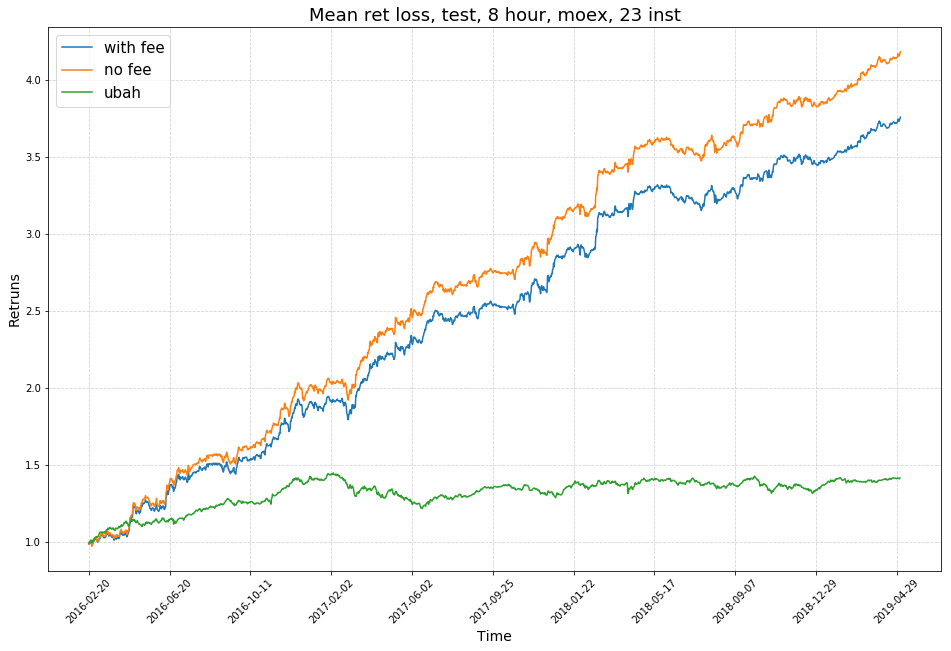

ERROR:sqlalchemy.pool.QueuePool:Exception during reset or similar
Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/base.py", line 704, in _rollback_impl
    self.engine.dialect.do_rollback(self.connection)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/engine/default.py", line 459, in do_rollback
    dbapi_connection.rollback()
psycopg2.errors.OperatorIntervention: unable to read data
DETAIL:  child connection forced to terminate due to client_idle_limit:1000 is reached
server closed the connection unexpectedly
	This probably means the server terminated abnormally
	before or while processing the request.


The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 709, in _finalize_fairy
    fairy._reset(pool)
  File "/home/ds/.local/lib/python3.6/site-packages/sqlalchemy/pool.py", line 878, i

In [234]:
path = "/moex_train_package_hour_8_2016/moex_train_package_\
2016_2019_hour_8_moex_23_instr_200k_test_0_07_win_15_feat_3/1/"
backtester, res_rl = process_results(path, 0.97, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

rmr
apv_no_fee: 1.241437
apv_with_fee: 0.48530805

sharpe_no_fee: 0.14251093685288974
sharpe_with_fee: -0.3038138563395789

olmar
apv_no_fee: 1.5279495
apv_with_fee: 0.77018994

sharpe_no_fee: 0.30622679990847274
sharpe_with_fee: -0.13333089962404118

crp
apv_no_fee: 1.4004166
apv_with_fee: 1.3958051

sharpe_no_fee: 0.6687913746879236
sharpe_with_fee: 0.6610714928333672

ons
apv_no_fee: 0.9244064
apv_with_fee: 0.9005616

sharpe_no_fee: -0.10186317193401728
sharpe_with_fee: -0.13401184912370223

rl
apv_no_fee: 4.1845627
apv_with_fee: 3.760003

sharpe_no_fee: 2.262250046339324
sharpe_with_fee: 1.9624861977275974



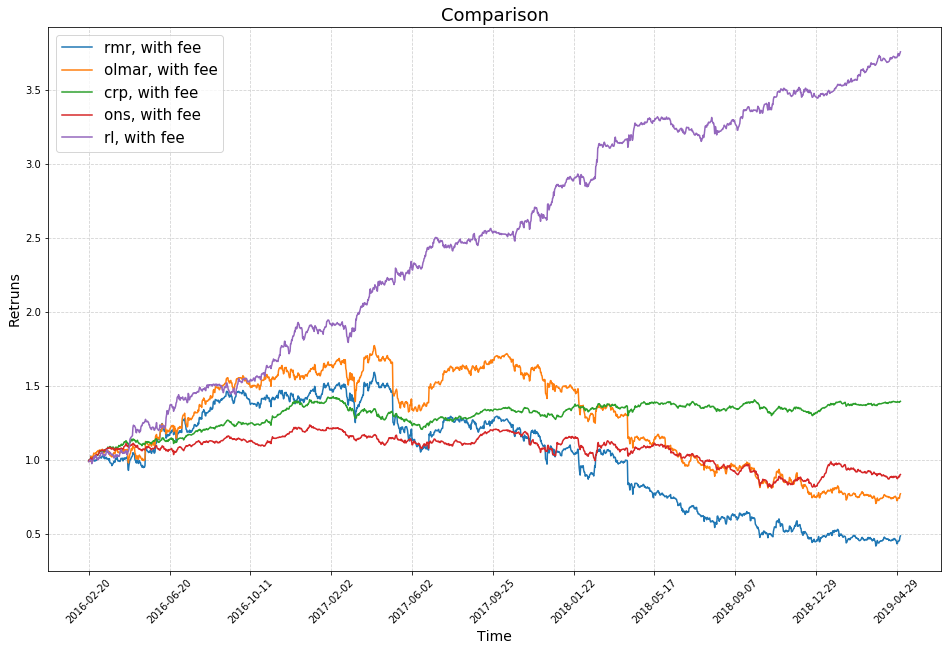

In [235]:
agents.append("rl")
multiple_results.append(res_rl)

plot_multiple_results(multiple_results, agents, plot_no_fee=False, plot_with_fee=True,
                    accumulate_method="cumsum", title="Comparison",
                    dates=backtester.test_dates)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 23, 1684)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f7713826438>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8/moex_train_package_2016_2019_hour_8_moex_23_instr_100k_test_0_07_win_15_feat_3/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8/moex_train_package_2016_2019_hour_8_moex_23_instr_100k_test_0_07_win_15_feat_3/1/netfile


days number: 50.5
apv_no_fee: 1.2084147
apv_with_fee: 1.1854818

sharpe_no_fee: 5.5207180794971755
sharpe_with_fee: 4.933600448808479



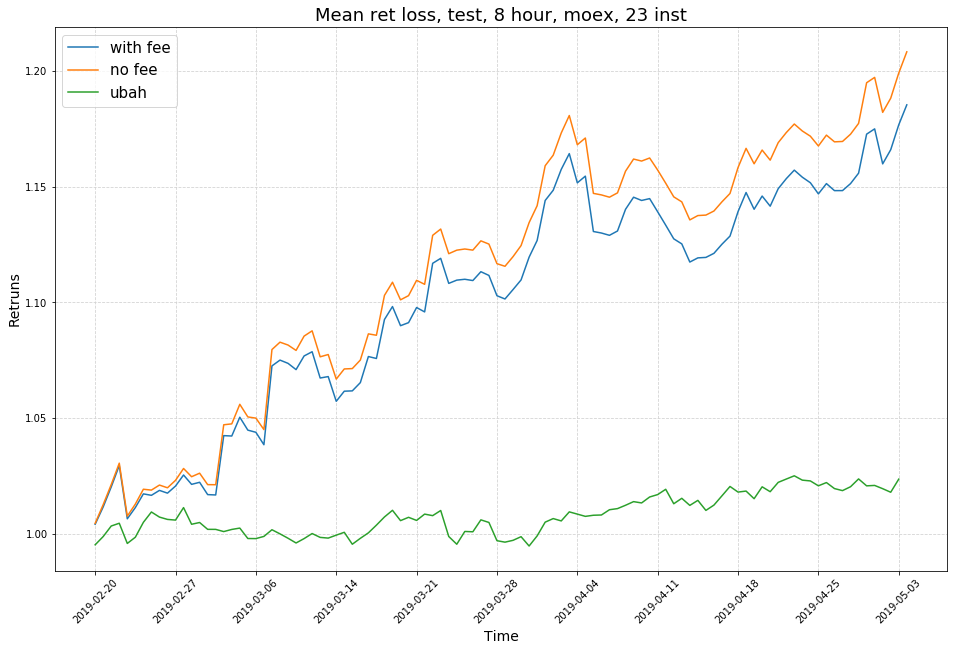

In [211]:
path = "/moex_train_package_hour_8/moex_train_package_\
2016_2019_hour_8_moex_23_instr_100k_test_0_07_win_15_feat_3/1/"
backtester, res_rl = process_results(path, 0.07, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 28800 ['close', 'high', 'low']
periods:  28800 28800
global_data shape:  (3, 23, 1684)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75c06fd128>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8/moex_train_package_2016_2019_hour_8_moex_23_instr_100k_test_0_07_win_15_feat_3/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8/moex_train_package_2016_2019_hour_8_moex_23_instr_100k_test_0_07_win_15_feat_3/1/netfile


days number: 791.5
apv_no_fee: 3.645895
apv_with_fee: 3.283358

sharpe_no_fee: 2.7462301550995734
sharpe_with_fee: 2.3719925147227854



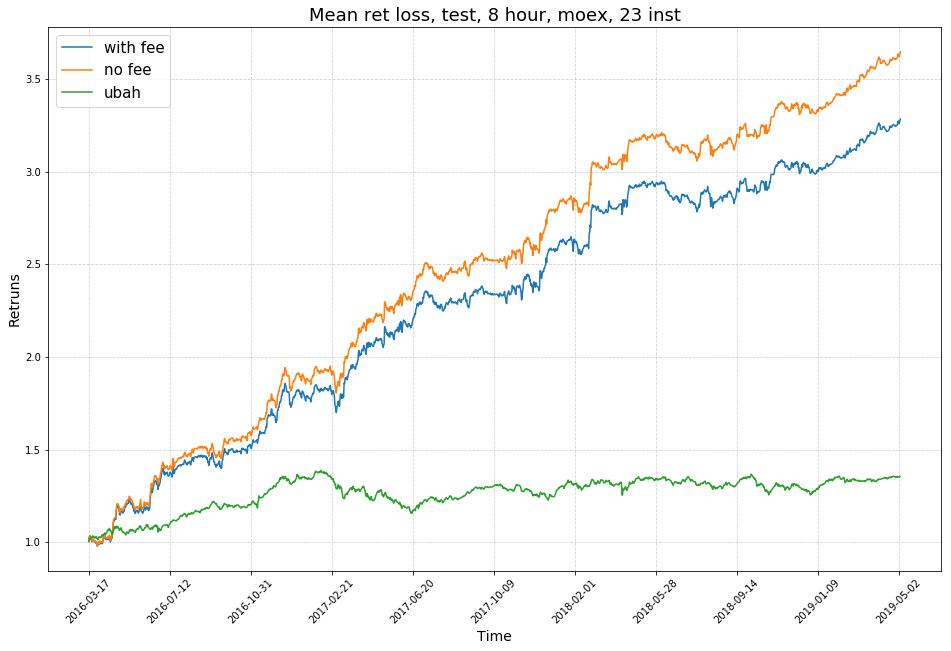

In [212]:
path = "/moex_train_package_hour_8/moex_train_package_\
2016_2019_hour_8_moex_23_instr_100k_test_0_07_win_15_feat_3/1/"
backtester, res_rl = process_results(path, 0.95, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1420070400 1557014400 28800 ['close', 'high']


/home/ds/kolomeytsev/rl_server_moex/rllib/marketdata/datamatrices.py:110: FutureWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

  panel = self.convert_to_panel(df, self.coins_list, features, self.__start, self.__end)


periods:  28800 28800
global_data shape:  (2, 23, 2184)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f75b00826a0>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2015/moex_train_package_2015_2019_hour_8_moex_23_instr_100k_test_0_07_win_30_close_high/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_8_2015/moex_train_package_2015_2019_hour_8_moex_23_instr_100k_test_0_07_win_30_close_high/1/netfile


days number: 60.5
apv_no_fee: 1.1838441
apv_with_fee: 1.1574395

sharpe_no_fee: 3.611358973739518
sharpe_with_fee: 3.092912037885115



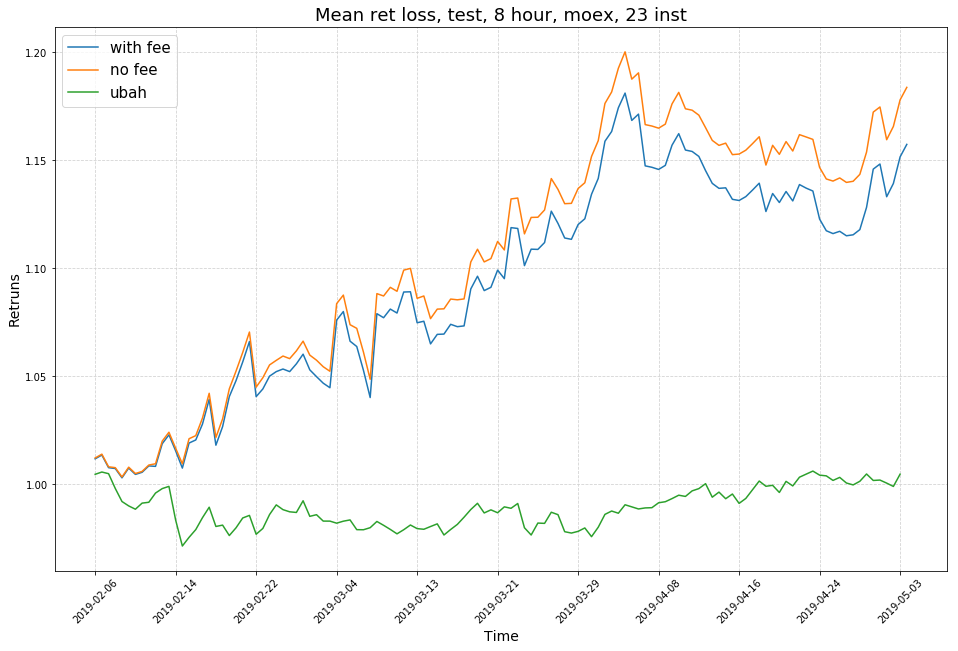

In [210]:
path = "/moex_train_package_hour_8_2015/moex_train_package_\
2015_2019_hour_8_moex_23_instr_100k_test_0_07_win_30_close_high/1/"
backtester, res_rl = process_results(path, 0.07, "Mean ret loss, test, 8 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2, start="2015/01/01")

['SBER', 'GAZP', 'LKOH', 'GMKN', 'MGNT', 'ROSN', 'VTBR', 'ALRS', 'NVTK', 'MOEX', 'CHMF', 'TATN', 'SNGS', 'MTSS', 'AFLT', 'NLMK', 'HYDR', 'MAGN', 'FEES', 'IRAO', 'RTKM', 'AFKS', 'RSTI']
Reading data: 1451606400 1557014400 14400 ['close']
periods:  14400 14400
global_data shape:  (1, 23, 2526)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f77132bc1d0>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_4/moex_train_package_2016_2019_hour_4_moex_23_instr_100k_test_0_07_win_30_close/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/moex_train_package_hour_4/moex_train_package_2016_2019_hour_4_moex_23_instr_100k_test_0_07_win_30_close/1/netfile


days number: 72.5
apv_no_fee: 1.1308863
apv_with_fee: 1.0877621

sharpe_no_fee: 2.8414148803605097
sharpe_with_fee: 1.9051948733411561



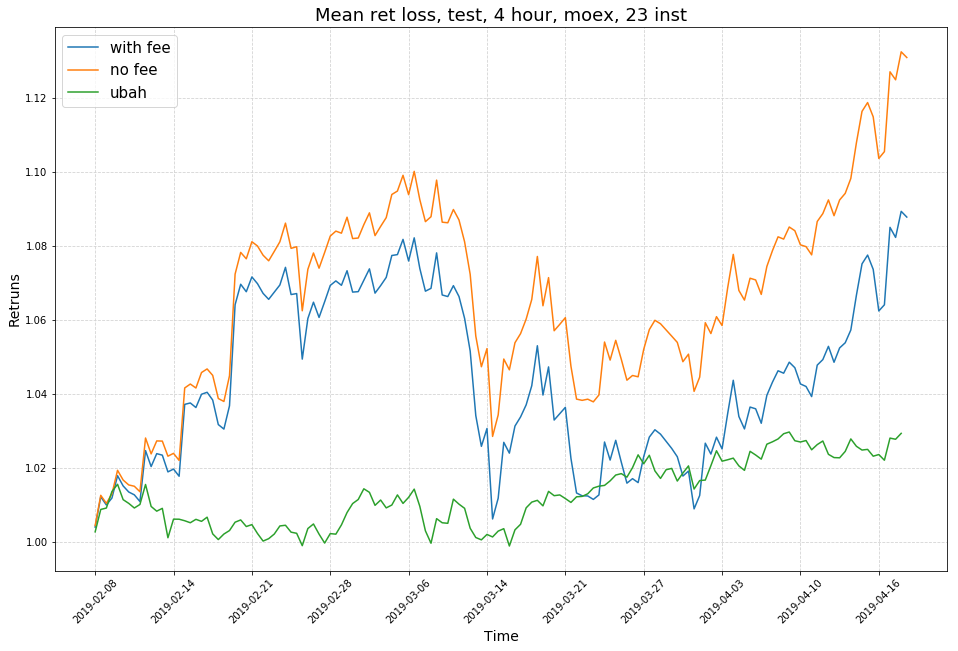

In [117]:
path = "/moex_train_package_hour_4/moex_train_package_\
2016_2019_hour_4_moex_23_instr_100k_test_0_07_win_30_close/1/"
backtester, res_rl = process_results(path, 0.07, "Mean ret loss, test, 4 hour, moex, 23 inst", 
                                     fee=4e-4, trades_per_day=2)

In [53]:
agents.append("rl")
multiple_results.append(res_rl)

plot_multiple_results(multiple_results, agents, plot_no_fee=False, plot_with_fee=True,
                    accumulate_method="cumsum", title="Comparison",
                    dates=backtester.test_dates)

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high', 'low']
periods:  3600 3600
global_data shape:  (3, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f546c479710>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_lr_2x_epochs_100k/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_lr_2x_epochs_100k/1/netfile


days number: 457.875
apv_no_fee: 2.4614682
apv_with_fee: 1.6687078

sharpe_no_fee: 2.835195628685126
sharpe_with_fee: 1.2980654764834918



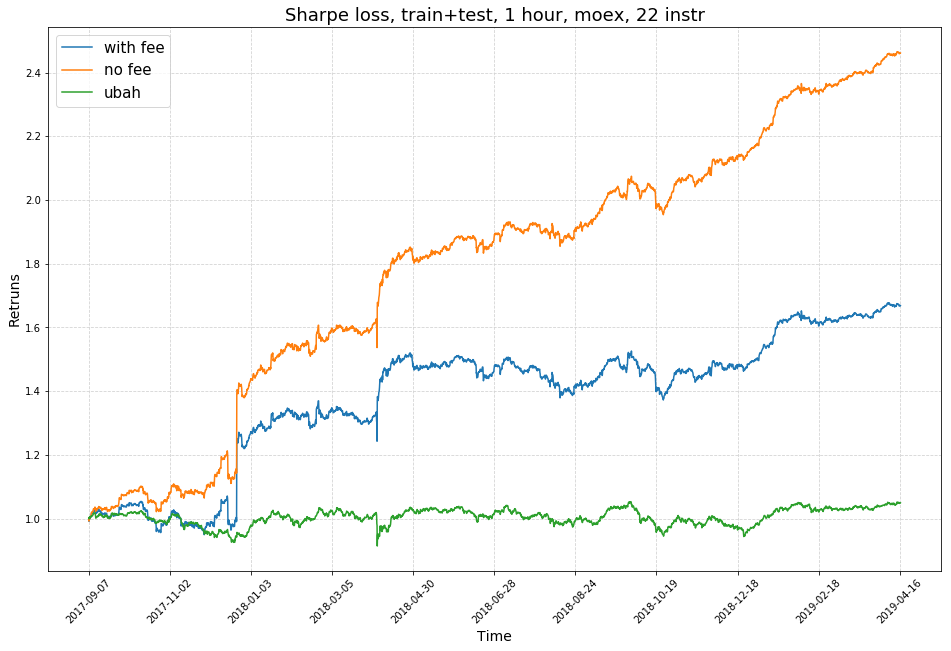

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high', 'low']
periods:  3600 3600
global_data shape:  (3, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f5410136f98>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_lr_2x_epochs_100k/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_lr_2x_epochs_100k/1/netfile


days number: 44.375
apv_no_fee: 1.1156825
apv_with_fee: 1.052965

sharpe_no_fee: 6.811296601964158
sharpe_with_fee: 3.107657796295057



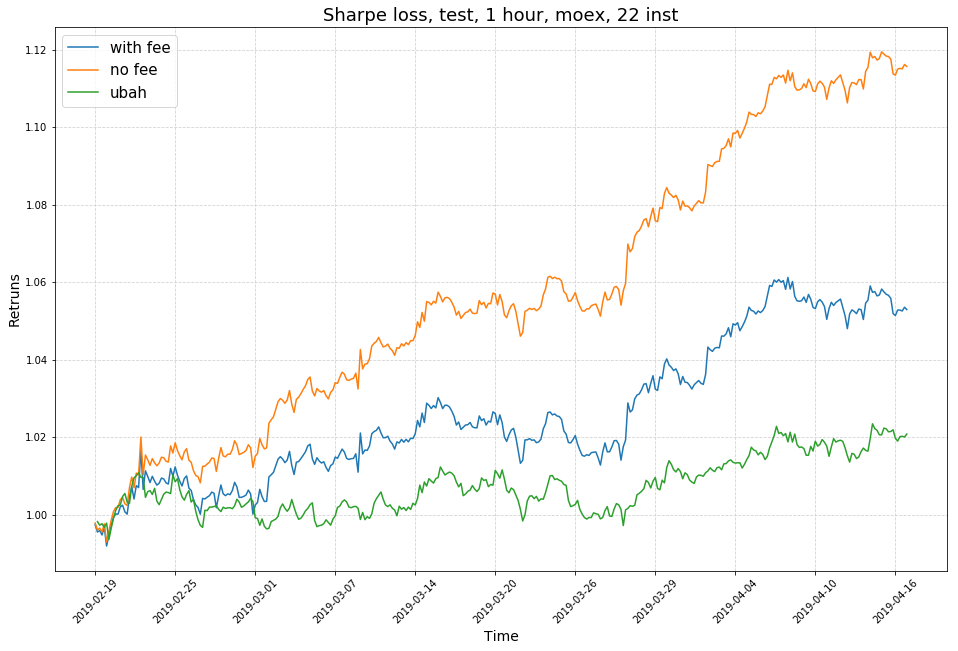

In [350]:
path = "/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_lr_2x_epochs_100k/1/"
process_results(path, 0.99, "Sharpe loss, train+test, 1 hour, moex, 22 instr")
backtester = process_results(path, 0.1, "Sharpe loss, test, 1 hour, moex, 22 inst")

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high', 'low']
periods:  3600 3600
global_data shape:  (3, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f5368ac3b38>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/loss_search/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_loss6/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/loss_search/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_loss6/1/netfile


days number: 457.875
apv_no_fee: 2.8655615
apv_with_fee: 1.8009393

sharpe_no_fee: 3.237522769649668
sharpe_with_fee: 1.3907957533800426



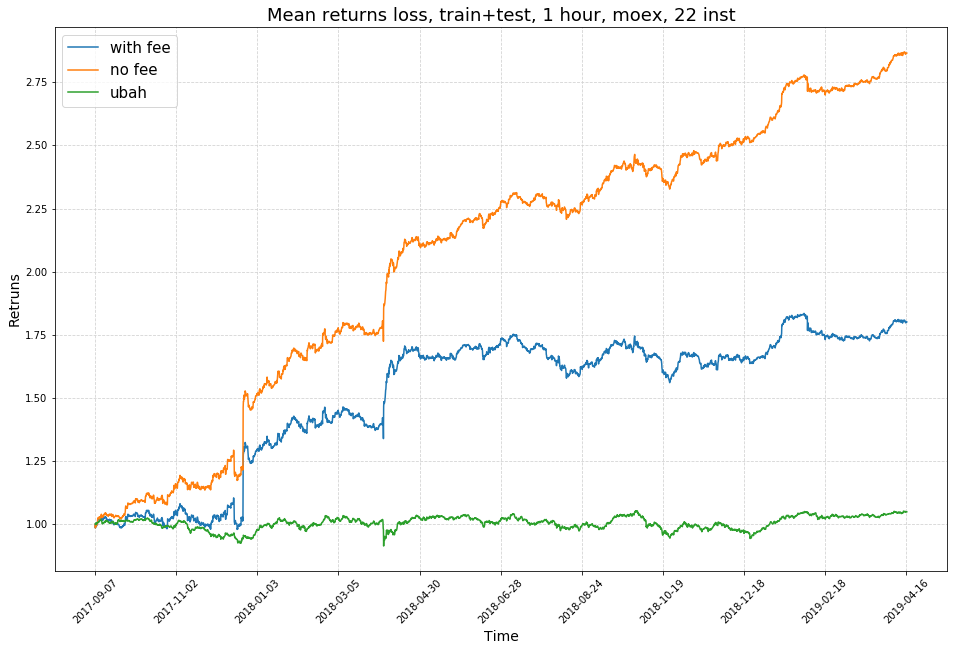

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high', 'low']
periods:  3600 3600
global_data shape:  (3, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f53ec09d4a8>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/loss_search/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_loss6/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/loss_search/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_loss6/1/netfile


days number: 44.375
apv_no_fee: 1.1500106
apv_with_fee: 1.0566854

sharpe_no_fee: 6.3759831067717
sharpe_with_fee: 2.398028334172613



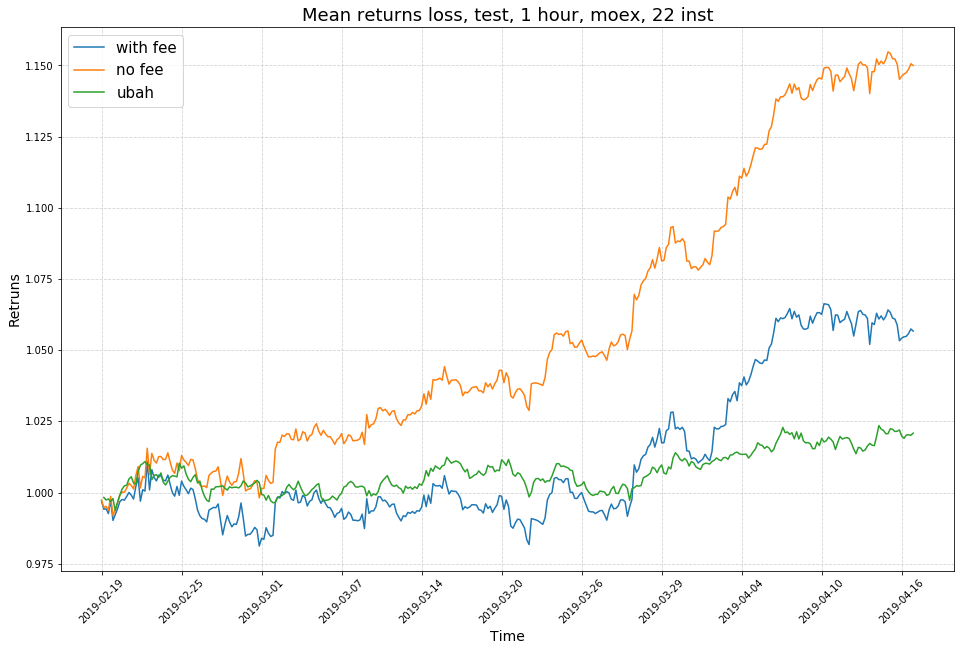

In [351]:
path = "/loss_search/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_loss6/1/"
process_results(path, 0.99, "Mean returns loss, train+test, 1 hour, moex, 22 inst")
process_results(path, 0.1, "Mean returns loss, test, 1 hour, moex, 22 inst")

## close

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close']
periods:  3600 3600
global_data shape:  (1, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f53a832bd30>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


days number: 457.875
apv_no_fee: 1.4338348
apv_with_fee: 1.3043549

sharpe_no_fee: 1.1751509542744099
sharpe_with_fee: 0.8249463844384293



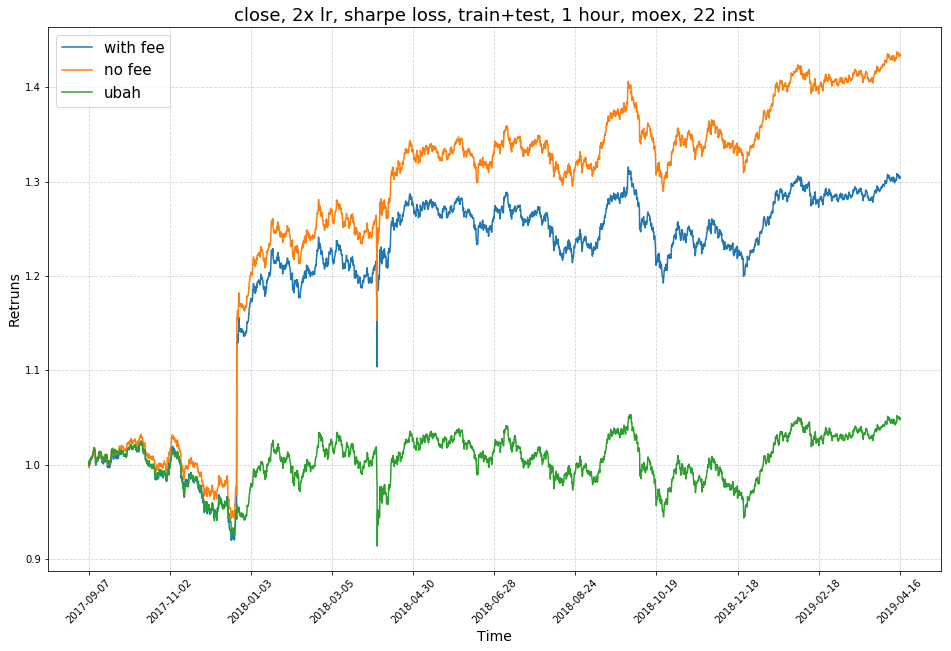

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close']
periods:  3600 3600
global_data shape:  (1, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f5520416978>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


days number: 44.375
apv_no_fee: 1.0310292
apv_with_fee: 1.0217876

sharpe_no_fee: 2.484185928196156
sharpe_with_fee: 1.7423488982424549



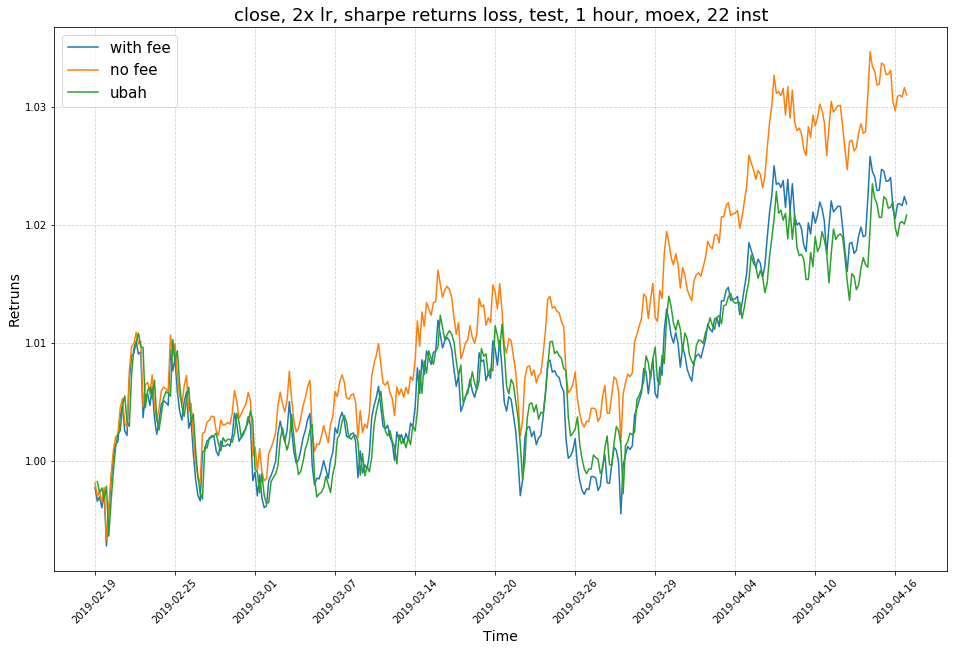

In [354]:
path = "/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/"
process_results(path, 0.99, "close, 2x lr, sharpe loss, train+test, 1 hour, moex, 22 inst")
process_results(path, 0.1, "close, 2x lr, sharpe returns loss, test, 1 hour, moex, 22 inst")

In [ ]:
path = "/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/"
process_results(path, 0.99, "close, 2x lr, sharpe loss, train+test, 1 hour, moex, 22 inst")
process_results(path, 0.1, "close, 2x lr, sharpe returns loss, test, 1 hour, moex, 22 inst")

## close+high

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high']
periods:  3600 3600
global_data shape:  (2, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f5410129c18>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


days number: 457.875
apv_no_fee: 1.7233757
apv_with_fee: 1.4297922

sharpe_no_fee: 1.561956310306823
sharpe_with_fee: 0.9287743674873751



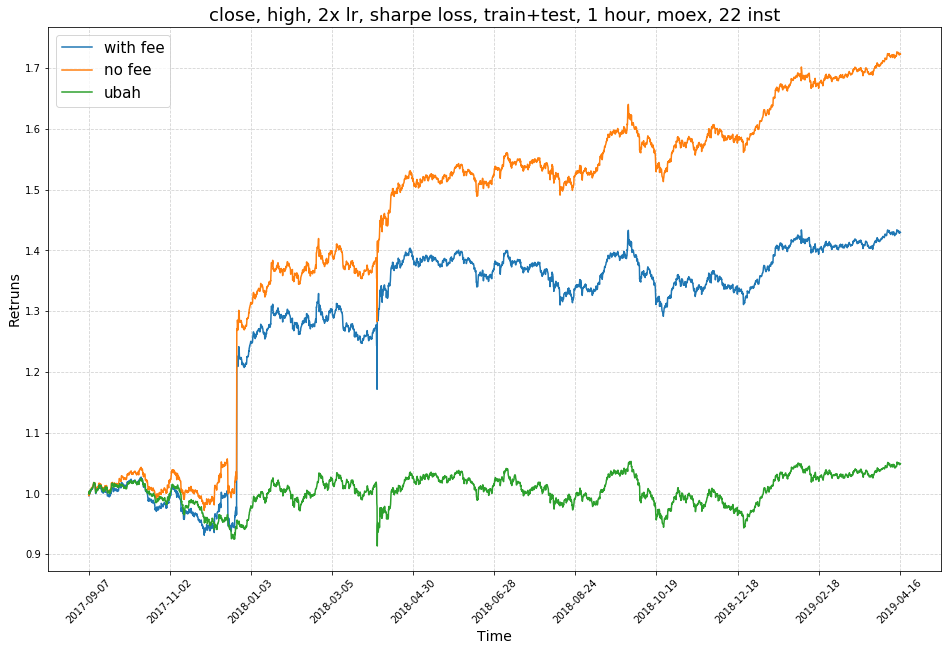

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high']
periods:  3600 3600
global_data shape:  (2, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f54ac1fa588>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


days number: 44.375
apv_no_fee: 1.0454028
apv_with_fee: 1.0253258

sharpe_no_fee: 3.4974959198427253
sharpe_with_fee: 1.948046691585688



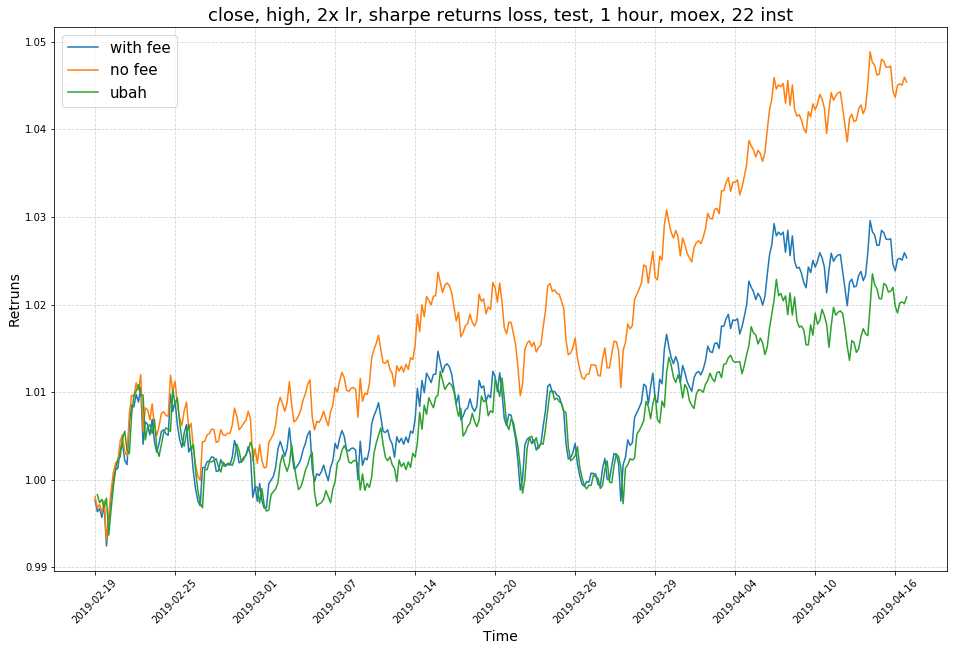

In [355]:
path = "/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/"
process_results(path, 0.99, "close, high, 2x lr, sharpe loss, train+test, 1 hour, moex, 22 inst")
process_results(path, 0.1, "close, high, 2x lr, sharpe returns loss, test, 1 hour, moex, 22 inst")

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high']
periods:  3600 3600
global_data shape:  (2, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f532cefef98>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


days number: 457.875
apv_no_fee: 2.1037247
apv_with_fee: 1.5110619

sharpe_no_fee: 2.14715005759037
sharpe_with_fee: 0.9948146510515091



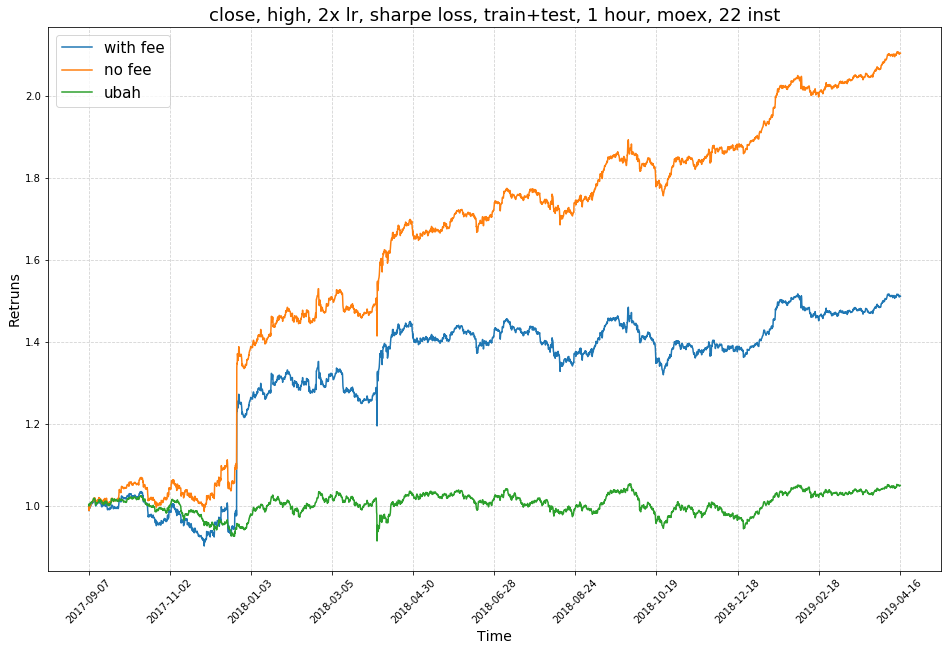

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'high']
periods:  3600 3600
global_data shape:  (2, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f532cea9160>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/netfile


days number: 44.375
apv_no_fee: 1.0941924
apv_with_fee: 1.0462534

sharpe_no_fee: 5.608661061406873
sharpe_with_fee: 2.744828138867443



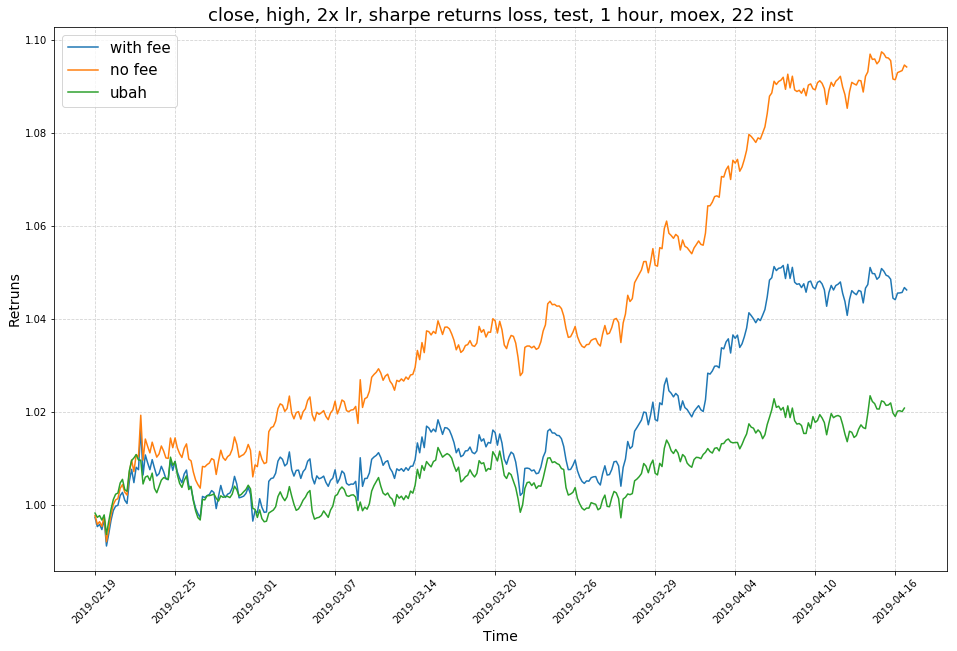

In [368]:
path = "/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_high/1/"
process_results(path, 0.99, "close, high, 2x lr, sharpe loss, train+test, 1 hour, moex, 22 inst")
process_results(path, 0.1, "close, high, 2x lr, sharpe returns loss, test, 1 hour, moex, 22 inst")

## close+low

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'low']
periods:  3600 3600
global_data shape:  (2, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f53c80b9550>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_low/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_low/1/netfile


days number: 457.875
apv_no_fee: 1.4150147
apv_with_fee: 1.3027816

sharpe_no_fee: 1.0693460647774151
sharpe_with_fee: 0.7803392023967022



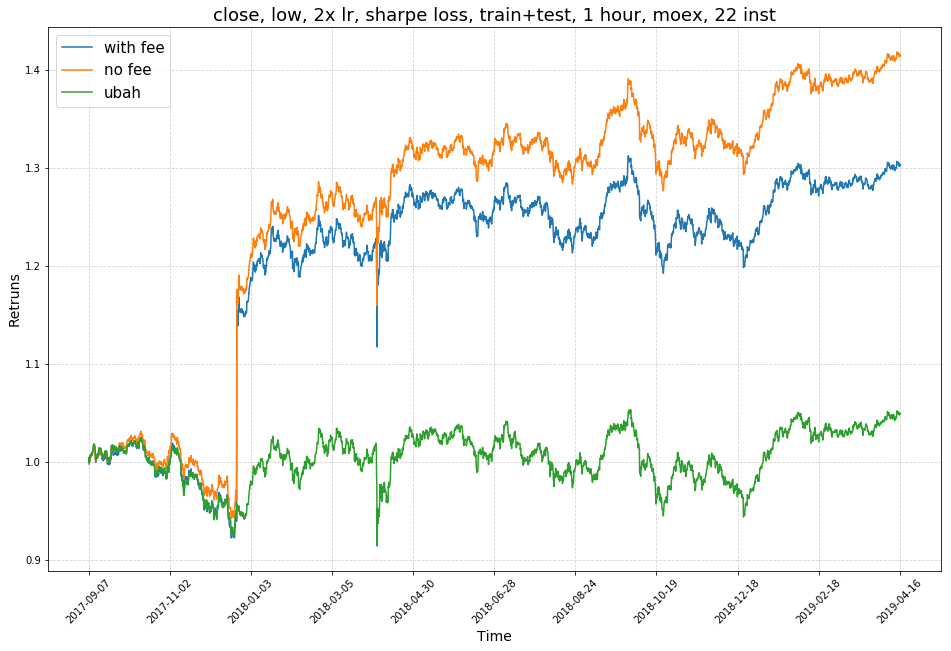

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close', 'low']
periods:  3600 3600
global_data shape:  (2, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f53c84bfe48>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_low/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_low/1/netfile


days number: 44.375
apv_no_fee: 1.0296454
apv_with_fee: 1.0215772

sharpe_no_fee: 2.387439448513912
sharpe_with_fee: 1.7358314128589005



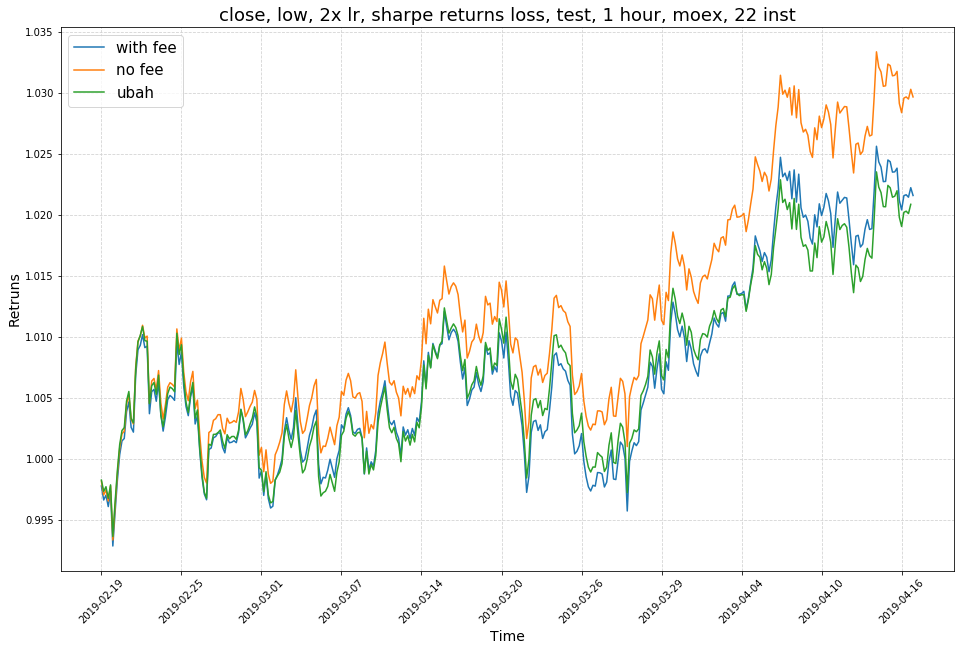

In [366]:
path = "/features_search_2x/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close_low/1/"
process_results(path, 0.99, "close, low, 2x lr, sharpe loss, train+test, 1 hour, moex, 22 inst")
process_results(path, 0.1, "close, low, 2x lr, sharpe returns loss, test, 1 hour, moex, 22 inst")

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close']
periods:  3600 3600
global_data shape:  (1, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f5210637ba8>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


days number: 457.875
apv_no_fee: 3.24544
apv_with_fee: 1.957022

sharpe_no_fee: 3.4943386234459597
sharpe_with_fee: 1.489832594344386



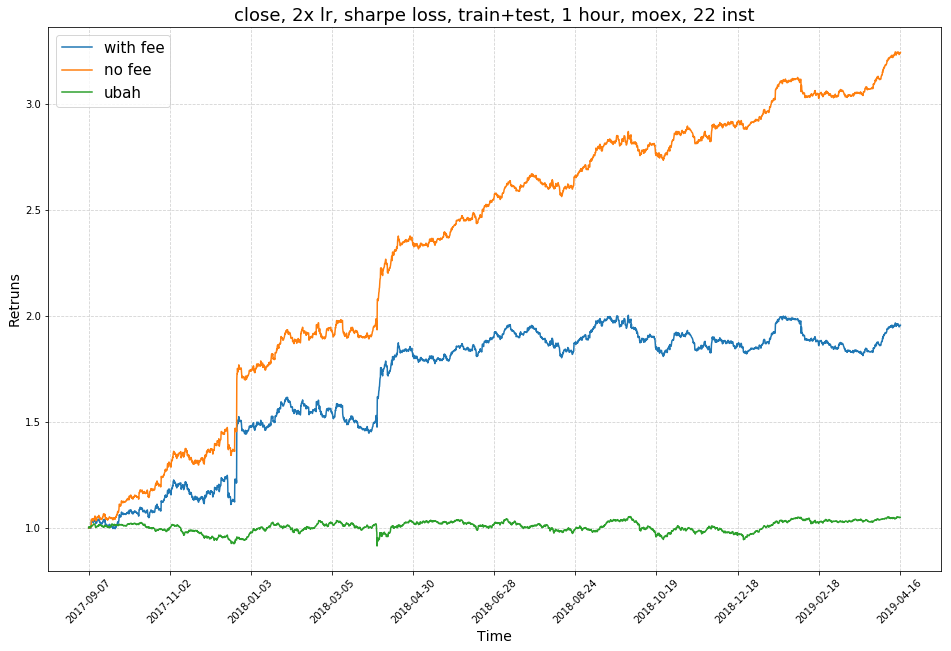

['HYDR', 'LKOH', 'GAZP', 'CHMF', 'VTBR', 'ALRS', 'MOEX', 'MTSS', 'FEES', 'NVTK', 'SBER', 'GMKN', 'ROSN', 'AFLT', 'RTKM', 'MGNT', 'RSTI', 'NLMK', 'MFON', 'AFKS', 'MAGN', 'IRAO']
Reading data: 1504224000 1555632000 3600 ['close']
periods:  3600 3600
global_data shape:  (1, 22, 3717)
self._matrix: <rllib.marketdata.datamatrices.DataMatrices object at 0x7f521053d358>
INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


INFO:tensorflow:Restoring parameters from /home/ds/kolomeytsev/rl_server_moex/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/netfile


days number: 44.375
apv_no_fee: 1.1924548
apv_with_fee: 1.076186

sharpe_no_fee: 6.181113890003494
sharpe_with_fee: 2.4344228824766314



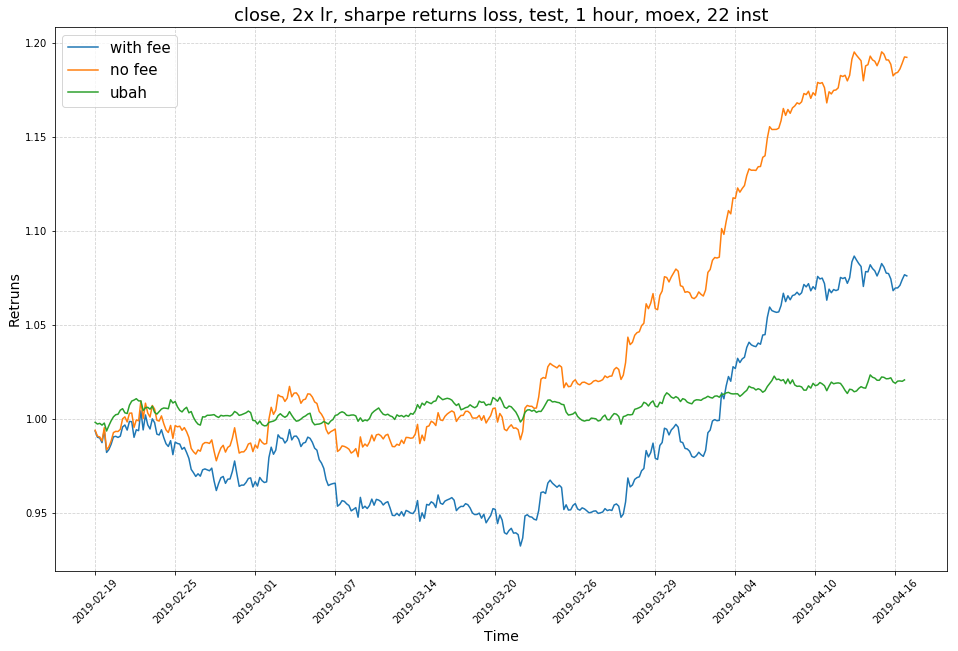

In [376]:
path = "/features_search_2x_mean_ret/train_package_20170901_20190429_hour_1_moex_22_instr_win_15_fee_0_0004_2x_close/1/"
process_results(path, 0.99, "close, 2x lr, sharpe loss, train+test, 1 hour, moex, 22 inst")
process_results(path, 0.1, "close, 2x lr, sharpe returns loss, test, 1 hour, moex, 22 inst")